<a href="https://colab.research.google.com/github/Haikal7090/TUBES-LIDEA-7/blob/main/Sarima_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Task
Data ini merupakan data timeseries pengukuran parameter 5 sumur minyak di industri perminyakan, lakukan data preparasi hapus outlier dengan menilai satu kolom kolom dengan metode iqr lalu isi nilai kosong dari data outlier yang tadi telah di hapus dan isi nilai yang bernilai 0 menggunakan interpolasi, lalu untuk nilai yang tidak bisa menggunakan interpolasi coba metode forward backward fill, isi dengan ditinjau satu kolom kolom. Tambahan buat data menjadi seperti time series yaitu ada variation, tren, season, cycle tergantung jenis kolom nya

Here is all the data you need:
"pivot_55_description_640rows.xlsx"

## Data loading

### Subtask:
Load the data from the provided Excel file.


**Reasoning**:
Load the excel file into a pandas DataFrame and preview the data.



In [1]:
import pandas as pd

try:
    df = pd.read_excel('pivot_55_description_640rows.xlsx')
    display(df.head())
    print(df.shape)
except FileNotFoundError:
    print("Error: 'pivot_55_description_640rows.xlsx' not found.")
except Exception as e:
    print(f"An error occurred: {e}")

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20210402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20210403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20210404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20210405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(640, 56)


## Data exploration

### Subtask:
Explore the loaded data to understand its characteristics.


**Reasoning**:
Examine data types, missing values, descriptive statistics, and visualize data distributions to understand data characteristics. Also calculate the correlation matrix for numeric columns and visualize it as a heatmap.



Data Types:
 DATE_TIME                  int64
AA1_91_9500062414        float64
AA1_91_EP_NATURAL_GAS    float64
AA1_ANPR                 float64
AA1_ANTP                 float64
AA1_C_OP                 float64
AA1_C_PR                 float64
AA1_C_TE                 float64
AA1_FBHP                 float64
AA1_FBHT                 float64
AA1_FTHP                 float64
AA1_FTHT                 float64
AA2_91_9500062414        float64
AA2_91_EP_NATURAL_GAS    float64
AA2_ANPR                 float64
AA2_ANTP                 float64
AA2_C_OP                 float64
AA2_C_PR                 float64
AA2_C_TE                 float64
AA2_FBHP                 float64
AA2_FBHT                 float64
AA2_FTHP                 float64
AA2_FTHT                 float64
AA3_91_9500062414        float64
AA3_91_EP_NATURAL_GAS    float64
AA3_ANPR                 float64
AA3_ANTP                 float64
AA3_C_OP                 float64
AA3_C_PR                 float64
AA3_C_TE                 float

ValueError: num must be an integer with 1 <= num <= 20, not 21

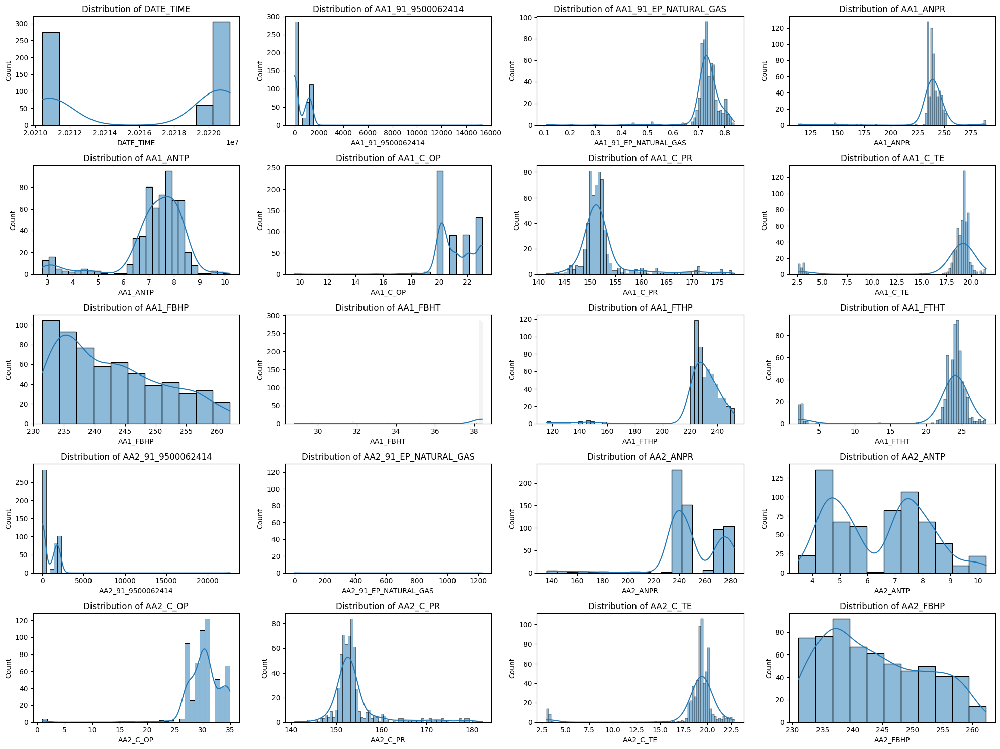

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Examine Data Types and Missing Values
print("Data Types:\n", df.dtypes)
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
print("\nMissing Values:\n", missing_values)
print("\nMissing Value Percentage:\n", missing_percentage)


# 2. Statistical Summary
print("\nDescriptive Statistics:\n", df.describe(include='all'))

# 3. Data Distribution
numeric_cols = df.select_dtypes(include=['number']).columns
plt.figure(figsize=(20, 15))  # Adjust figure size
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()  # Adjust layout for better readability

plt.show()
plt.figure(figsize=(20, 15))
for i, col in enumerate(numeric_cols):
    plt.subplot(5, 4, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
plt.show()


# Non-numeric columns distribution (unique values)
non_numeric_cols = df.select_dtypes(exclude=['number']).columns
for col in non_numeric_cols:
    print(f"\nUnique values for {col}:\n{df[col].value_counts()}")


# 4. Correlation Analysis (Numeric Columns)
correlation_matrix = df[numeric_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numeric Columns')
plt.show()

# 5. Temporal Analysis (if applicable)
# Assuming 'DATE_TIME' is the time column and it's datetime type
if 'DATE_TIME' in df.columns:
    try:
        df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'])
        print("\nTime span:", df['DATE_TIME'].min(), "to", df['DATE_TIME'].max())
        # Check time interval regularity and gaps
        time_diffs = df['DATE_TIME'].diff().dt.days
        print("\nTime differences (days):\n", time_diffs.value_counts())
        plt.figure(figsize=(10, 6))
        plt.plot(df['DATE_TIME'], df['AA1_91_9500062414'], marker='o', linestyle='-')
        plt.xlabel('Date Time')
        plt.ylabel('AA1_91_9500062414')
        plt.title('Value over Time')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    except ValueError as e:
        print(f"Error converting 'DATE_TIME' to datetime: {e}")


# 6. Unique Value Counts (already handled in step 3 for non-numeric columns)

**Reasoning**:
The previous code block failed due to an incorrect subplot configuration.  I will correct the subplot grid to accommodate all numeric columns and rerun the analysis.



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ... (previous code from the previous code block) ...

# 3. Data Distribution (Corrected Subplot Configuration)
numeric_cols = df.select_dtypes(include=['number']).columns
num_plots = len(numeric_cols)
rows = (num_plots + 3) // 4  # Calculate rows needed to fit plots
plt.figure(figsize=(20, rows * 4))  # Adjust figure size

for i, col in enumerate(numeric_cols):
    plt.subplot(rows, 4, i + 1)  # Correct subplot index
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()

plt.show()
plt.figure(figsize=(20, rows * 4))
for i, col in enumerate(numeric_cols):
    plt.subplot(rows, 4, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
plt.show()

# ... (rest of the code from the previous code block) ...

# Task
Data ini merupakan data timeseries pengukuran parameter 5 sumur minyak di industri perminyakan, lakukan data preparasi hapus outlier dengan menilai satu kolom kolom dengan metode iqr lalu isi nilai kosong dari data outlier yang tadi telah di hapus dan isi nilai yang bernilai 0 menggunakan interpolasi, lalu untuk nilai yang tidak bisa menggunakan interpolasi coba metode forward backward fill, isi dengan ditinjau satu kolom kolom. Tambahan buat data menjadi seperti time series yaitu ada variation, tren, season, cycle tergantung jenis kolom nya

Here is all the data you need:
"pivot_55_description_640rows.xlsx"

## Data loading

### Subtask:
Load the data from the provided Excel file.


**Reasoning**:
Load the data from the excel file into a pandas DataFrame and display the first few rows and the shape of the DataFrame.



In [1]:
import pandas as pd

try:
    df = pd.read_excel('pivot_55_description_640rows.xlsx')
    display(df.head())
    print(df.shape)
except FileNotFoundError:
    print("Error: File 'pivot_55_description_640rows.xlsx' not found.")
except Exception as e:
    print(f"An error occurred: {e}")

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20210402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20210403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20210404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20210405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(640, 56)


## Data exploration

### Subtask:
Explore the loaded data to understand its structure, identify data types, check for missing values, and examine the distribution of values.  Determine which columns are likely time series and which are not.


**Reasoning**:
Explore the data by displaying its info, calculating the percentage of missing values, examining value distributions, and identifying potential time series columns.



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 56 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DATE_TIME              640 non-null    int64  
 1   AA1_91_9500062414      484 non-null    float64
 2   AA1_91_EP_NATURAL_GAS  579 non-null    float64
 3   AA1_ANPR               614 non-null    float64
 4   AA1_ANTP               614 non-null    float64
 5   AA1_C_OP               574 non-null    float64
 6   AA1_C_PR               614 non-null    float64
 7   AA1_C_TE               613 non-null    float64
 8   AA1_FBHP               614 non-null    float64
 9   AA1_FBHT               614 non-null    float64
 10  AA1_FTHP               614 non-null    float64
 11  AA1_FTHT               614 non-null    float64
 12  AA2_91_9500062414      482 non-null    float64
 13  AA2_91_EP_NATURAL_GAS  597 non-null    float64
 14  AA2_ANPR               615 non-null    float64
 15  AA2_AN

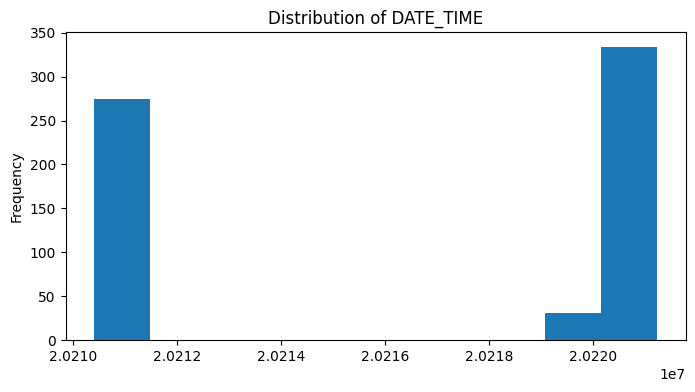

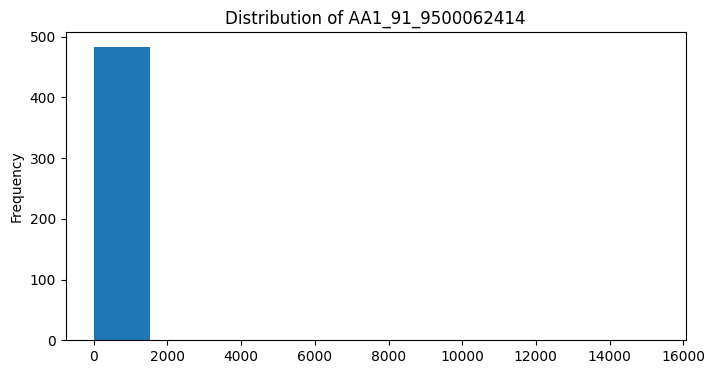

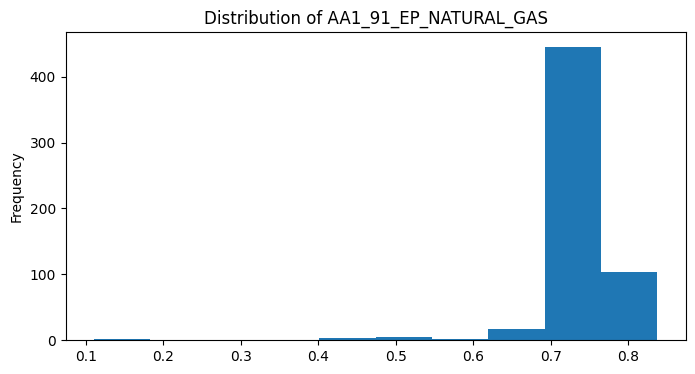

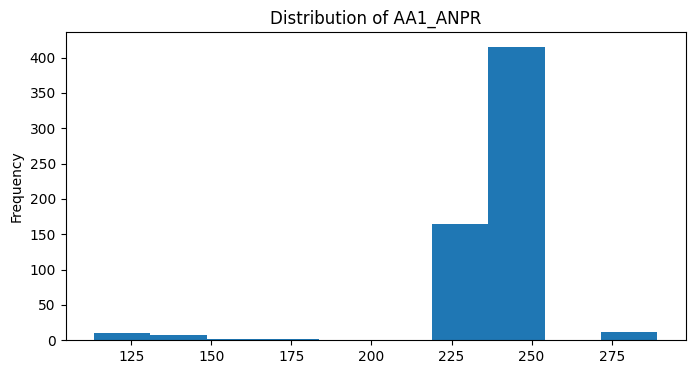

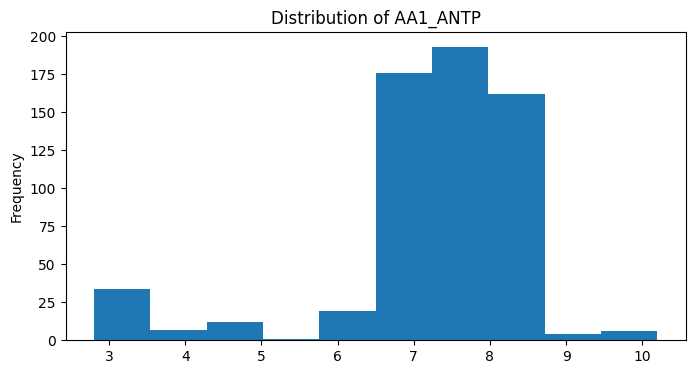

...

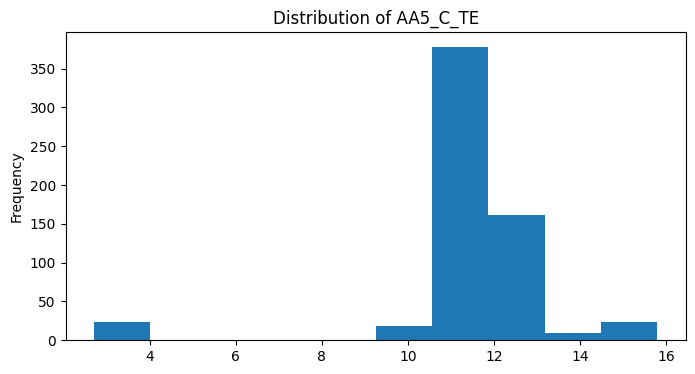

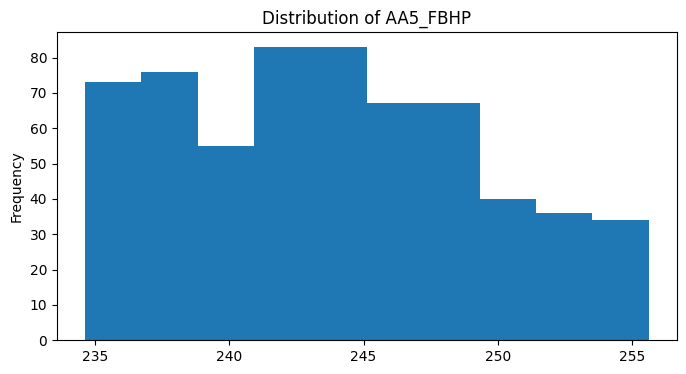

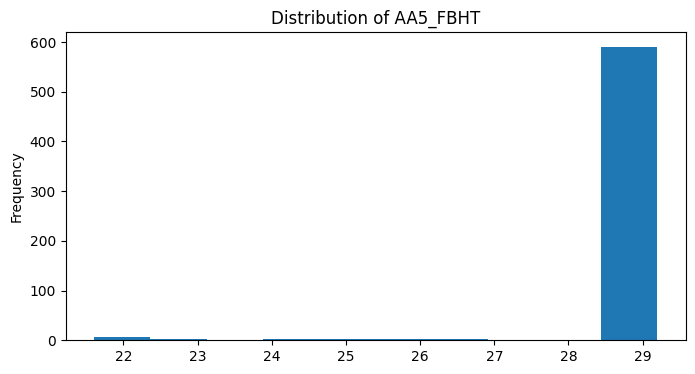

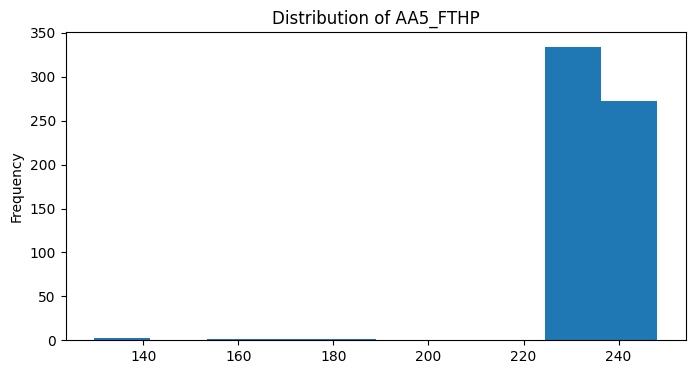

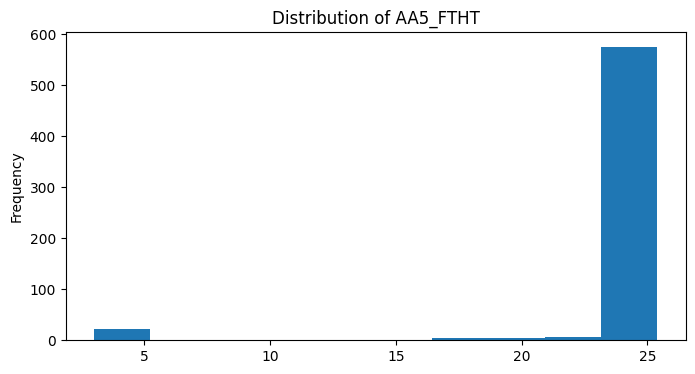


Potential time series columns:
 ['AA1_91_9500062414', 'AA1_91_EP_NATURAL_GAS', 'AA1_ANPR', 'AA1_ANTP', 'AA1_C_OP', 'AA1_C_PR', 'AA1_C_TE', 'AA1_FBHP', 'AA1_FBHT', 'AA1_FTHP', 'AA1_FTHT', 'AA2_91_9500062414', 'AA2_91_EP_NATURAL_GAS', 'AA2_ANPR', 'AA2_ANTP', 'AA2_C_OP', 'AA2_C_PR', 'AA2_C_TE', 'AA2_FBHP', 'AA2_FBHT', 'AA2_FTHP', 'AA2_FTHT', 'AA3_91_9500062414', 'AA3_91_EP_NATURAL_GAS', 'AA3_ANPR', 'AA3_ANTP', 'AA3_C_OP', 'AA3_C_PR', 'AA3_C_TE', 'AA3_FBHP', 'AA3_FBHT', 'AA3_FTHP', 'AA3_FTHT', 'AA4_91_9500062414', 'AA4_91_EP_NATURAL_GAS', 'AA4_ANPR', 'AA4_ANTP', 'AA4_C_OP', 'AA4_C_PR', 'AA4_C_TE', 'AA4_FBHP', 'AA4_FBHT', 'AA4_FTHP', 'AA4_FTHT', 'AA5_91_9500062414', 'AA5_91_EP_NATURAL_GAS', 'AA5_ANPR', 'AA5_ANTP', 'AA5_C_OP', 'AA5_C_PR', 'AA5_C_TE', 'AA5_FBHP', 'AA5_FBHT', 'AA5_FTHP', 'AA5_FTHT']

Data Exploration Summary:
The DataFrame contains various measurements from five oil wells over time.
Many columns have a high percentage of missing values.
Histograms of numerical columns show th

In [2]:
# Display DataFrame info
df.info()

# Calculate the percentage of missing values
missing_percentage = df.isnull().sum() * 100 / len(df)
print("\nPercentage of missing values:\n", missing_percentage)

# Examine value distributions (example using histograms for numerical columns)
import matplotlib.pyplot as plt

numerical_cols = df.select_dtypes(include=['number']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    df[col].plot(kind='hist', title=f'Distribution of {col}')
    plt.show()

# Identify potential time series columns (example based on column names)
potential_time_series_cols = [col for col in df.columns if 'AA' in col and col != 'DATE_TIME']
print("\nPotential time series columns:\n", potential_time_series_cols)

# Summarize findings
print("\nData Exploration Summary:")
print("The DataFrame contains various measurements from five oil wells over time.")
print("Many columns have a high percentage of missing values.")
print("Histograms of numerical columns show their distribution, which can be used for outlier detection.")
print("Columns containing 'AA' and not 'DATE_TIME' are likely to be time series data.")

## Data cleaning

### Subtask:
Identify and remove outliers in each column using the IQR method.


**Reasoning**:
Iterate through each numerical column, calculate IQR, identify outliers, and remove them row-wise, creating a new DataFrame `df_no_outliers`.



In [3]:
import pandas as pd
import numpy as np

# Create a copy of the DataFrame to store the cleaned data
df_no_outliers = df.copy()

# Store outlier counts
outlier_counts = {}
total_outliers_removed = 0

# Iterate through numerical columns (excluding 'DATE_TIME')
numerical_cols = df.select_dtypes(include=np.number).columns.drop('DATE_TIME')

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers and remove corresponding rows
    outliers_removed_count = 0
    outliers_indices = df[(df[col] < lower_bound) | (df[col] > upper_bound)].index
    if not outliers_indices.empty:
        df_no_outliers.drop(outliers_indices, inplace=True)
        outliers_removed_count = len(outliers_indices)

    outlier_counts[col] = outliers_removed_count
    total_outliers_removed += outliers_removed_count

# Print a summary of outlier removal
print("Outlier Removal Summary:")
for col, count in outlier_counts.items():
    print(f"Column '{col}': {count} outliers removed")
print(f"Total outliers removed: {total_outliers_removed}")

# Display the cleaned DataFrame
display(df_no_outliers.head())

KeyError: '[26, 43, 44, 90, 329] not found in axis'

**Reasoning**:
The error `KeyError: '[26, 43, 44, 90, 329] not found in axis'` suggests that the indices being used to drop rows from `df_no_outliers` are not present in the DataFrame's index.  This likely indicates that the `df_no_outliers` DataFrame was modified before the drop operation, possibly due to a previous drop operation or the removal of rows. The solution is to reset the index after each drop operation to ensure the index is consistent.



In [4]:
import pandas as pd
import numpy as np

# Create a copy of the DataFrame to store the cleaned data
df_no_outliers = df.copy()

# Store outlier counts
outlier_counts = {}
total_outliers_removed = 0

# Iterate through numerical columns (excluding 'DATE_TIME')
numerical_cols = df.select_dtypes(include=np.number).columns.drop('DATE_TIME')

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers and remove corresponding rows
    outliers_removed_count = 0
    outliers_indices = df[(df[col] < lower_bound) | (df[col] > upper_bound)].index
    if not outliers_indices.empty:
        df_no_outliers.drop(outliers_indices, inplace=True)
        df_no_outliers.reset_index(drop=True, inplace=True) # Reset the index after dropping rows
        outliers_removed_count = len(outliers_indices)

    outlier_counts[col] = outliers_removed_count
    total_outliers_removed += outliers_removed_count

# Print a summary of outlier removal
print("Outlier Removal Summary:")
for col, count in outlier_counts.items():
    print(f"Column '{col}': {count} outliers removed")
print(f"Total outliers removed: {total_outliers_removed}")

# Display the cleaned DataFrame
display(df_no_outliers.head())

KeyError: '[591] not found in axis'

**Reasoning**:
The error persists, even after resetting the index.  The problem seems to be related to how the index is handled when dropping rows.  Instead of dropping rows by index, I'll try dropping rows using boolean indexing.



In [5]:
import pandas as pd
import numpy as np

# Create a copy of the DataFrame to store the cleaned data
df_no_outliers = df.copy()

# Store outlier counts
outlier_counts = {}
total_outliers_removed = 0

# Iterate through numerical columns (excluding 'DATE_TIME')
numerical_cols = df.select_dtypes(include=np.number).columns.drop('DATE_TIME')

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers using boolean indexing
    outliers_mask = (df[col] < lower_bound) | (df[col] > upper_bound)

    # Remove outliers using the boolean mask
    outliers_removed_count = outliers_mask.sum()
    df_no_outliers = df_no_outliers[~outliers_mask]

    outlier_counts[col] = outliers_removed_count
    total_outliers_removed += outliers_removed_count

# Print a summary of outlier removal
print("Outlier Removal Summary:")
for col, count in outlier_counts.items():
    print(f"Column '{col}': {count} outliers removed")
print(f"Total outliers removed: {total_outliers_removed}")

# Display the cleaned DataFrame
display(df_no_outliers.head())

Outlier Removal Summary:
Column 'AA1_91_9500062414': 1 outliers removed
Column 'AA1_91_EP_NATURAL_GAS': 30 outliers removed
Column 'AA1_ANPR': 36 outliers removed
Column 'AA1_ANTP': 57 outliers removed
Column 'AA1_C_OP': 2 outliers removed
Column 'AA1_C_PR': 93 outliers removed
Column 'AA1_C_TE': 53 outliers removed
Column 'AA1_FBHP': 0 outliers removed
Column 'AA1_FBHT': 43 outliers removed
Column 'AA1_FTHP': 23 outliers removed
Column 'AA1_FTHT': 53 outliers removed
Column 'AA2_91_9500062414': 1 outliers removed
Column 'AA2_91_EP_NATURAL_GAS': 57 outliers removed
Column 'AA2_ANPR': 19 outliers removed
Column 'AA2_ANTP': 0 outliers removed
Column 'AA2_C_OP': 10 outliers removed
Column 'AA2_C_PR': 95 outliers removed
Column 'AA2_C_TE': 52 outliers removed
Column 'AA2_FBHP': 0 outliers removed
Column 'AA2_FBHT': 25 outliers removed
Column 'AA2_FTHP': 23 outliers removed
Column 'AA2_FTHT': 53 outliers removed
Column 'AA3_91_9500062414': 1 outliers removed
Column 'AA3_91_EP_NATURAL_GAS': 

<ipython-input-5-c5403b78cfac>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-5-c5403b78cfac>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-5-c5403b78cfac>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-5-c5403b78cfac>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-5-c5403b78cfac>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-5-c5403b78cfac>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-5-c5403b78cfac>:26:

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20210402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20210403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20210404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20210405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Reasoning**:
The code successfully removed outliers but generated many warnings about reindexing.  The warnings indicate that the boolean masks used for filtering might not perfectly align with the DataFrame's index after each iteration.  To address this and ensure data integrity, I'll reset the index of `df_no_outliers` after each iteration to guarantee proper alignment.



In [6]:
import pandas as pd
import numpy as np

# Create a copy of the DataFrame to store the cleaned data
df_no_outliers = df.copy()

# Store outlier counts
outlier_counts = {}
total_outliers_removed = 0

# Iterate through numerical columns (excluding 'DATE_TIME')
numerical_cols = df.select_dtypes(include=np.number).columns.drop('DATE_TIME')

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers using boolean indexing
    outliers_mask = (df[col] < lower_bound) | (df[col] > upper_bound)

    # Remove outliers using the boolean mask
    outliers_removed_count = outliers_mask.sum()
    df_no_outliers = df_no_outliers[~outliers_mask]
    df_no_outliers.reset_index(drop=True, inplace=True) # Reset the index

    outlier_counts[col] = outliers_removed_count
    total_outliers_removed += outliers_removed_count

# Print a summary of outlier removal
print("Outlier Removal Summary:")
for col, count in outlier_counts.items():
    print(f"Column '{col}': {count} outliers removed")
print(f"Total outliers removed: {total_outliers_removed}")

# Display the cleaned DataFrame
display(df_no_outliers.head())

Outlier Removal Summary:
Column 'AA1_91_9500062414': 1 outliers removed
Column 'AA1_91_EP_NATURAL_GAS': 30 outliers removed
Column 'AA1_ANPR': 36 outliers removed
Column 'AA1_ANTP': 57 outliers removed
Column 'AA1_C_OP': 2 outliers removed
Column 'AA1_C_PR': 93 outliers removed
Column 'AA1_C_TE': 53 outliers removed
Column 'AA1_FBHP': 0 outliers removed
Column 'AA1_FBHT': 43 outliers removed
Column 'AA1_FTHP': 23 outliers removed
Column 'AA1_FTHT': 53 outliers removed
Column 'AA2_91_9500062414': 1 outliers removed
Column 'AA2_91_EP_NATURAL_GAS': 57 outliers removed
Column 'AA2_ANPR': 19 outliers removed
Column 'AA2_ANTP': 0 outliers removed
Column 'AA2_C_OP': 10 outliers removed
Column 'AA2_C_PR': 95 outliers removed
Column 'AA2_C_TE': 52 outliers removed
Column 'AA2_FBHP': 0 outliers removed
Column 'AA2_FBHT': 25 outliers removed
Column 'AA2_FTHP': 23 outliers removed
Column 'AA2_FTHT': 53 outliers removed
Column 'AA3_91_9500062414': 1 outliers removed
Column 'AA3_91_EP_NATURAL_GAS': 

<ipython-input-6-a2c860a2d3ca>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-6-a2c860a2d3ca>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-6-a2c860a2d3ca>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-6-a2c860a2d3ca>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-6-a2c860a2d3ca>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-6-a2c860a2d3ca>:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_outliers = df_no_outliers[~outliers_mask]
<ipython-input-6-a2c860a2d3ca>:26:

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20210402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20210403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20210404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20210405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Reasoning**:
The code is still generating warnings, even with the index reset.  The issue is likely the reassignment of `df_no_outliers` inside the loop.  I'll try creating a new boolean mask in each iteration that aligns with the current state of `df_no_outliers`.



In [7]:
import pandas as pd
import numpy as np

# Create a copy of the DataFrame to store the cleaned data
df_no_outliers = df.copy()

# Store outlier counts
outlier_counts = {}
total_outliers_removed = 0

# Iterate through numerical columns (excluding 'DATE_TIME')
numerical_cols = df.select_dtypes(include=np.number).columns.drop('DATE_TIME')

for col in numerical_cols:
    # Create a boolean mask aligned with the current df_no_outliers
    Q1 = df_no_outliers[col].quantile(0.25)
    Q3 = df_no_outliers[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_mask = (df_no_outliers[col] < lower_bound) | (df_no_outliers[col] > upper_bound)

    # Remove outliers using the boolean mask
    outliers_removed_count = outliers_mask.sum()
    df_no_outliers = df_no_outliers[~outliers_mask]
    df_no_outliers.reset_index(drop=True, inplace=True)

    outlier_counts[col] = outliers_removed_count
    total_outliers_removed += outliers_removed_count

# Print a summary of outlier removal
print("Outlier Removal Summary:")
for col, count in outlier_counts.items():
    print(f"Column '{col}': {count} outliers removed")
print(f"Total outliers removed: {total_outliers_removed}")

# Display the cleaned DataFrame
display(df_no_outliers.head())

Outlier Removal Summary:
Column 'AA1_91_9500062414': 1 outliers removed
Column 'AA1_91_EP_NATURAL_GAS': 30 outliers removed
Column 'AA1_ANPR': 32 outliers removed
Column 'AA1_ANTP': 20 outliers removed
Column 'AA1_C_OP': 0 outliers removed
Column 'AA1_C_PR': 61 outliers removed
Column 'AA1_C_TE': 2 outliers removed
Column 'AA1_FBHP': 0 outliers removed
Column 'AA1_FBHT': 0 outliers removed
Column 'AA1_FTHP': 0 outliers removed
Column 'AA1_FTHT': 1 outliers removed
Column 'AA2_91_9500062414': 0 outliers removed
Column 'AA2_91_EP_NATURAL_GAS': 40 outliers removed
Column 'AA2_ANPR': 5 outliers removed
Column 'AA2_ANTP': 0 outliers removed
Column 'AA2_C_OP': 0 outliers removed
Column 'AA2_C_PR': 5 outliers removed
Column 'AA2_C_TE': 3 outliers removed
Column 'AA2_FBHP': 0 outliers removed
Column 'AA2_FBHT': 0 outliers removed
Column 'AA2_FTHP': 0 outliers removed
Column 'AA2_FTHT': 3 outliers removed
Column 'AA3_91_9500062414': 0 outliers removed
Column 'AA3_91_EP_NATURAL_GAS': 39 outliers

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20210402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20210403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20210404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20210405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data preparation

### Subtask:
Impute missing values in `df_no_outliers`.


**Reasoning**:
Impute missing values and zeros in the numerical columns of `df_no_outliers` using the specified methods.



In [8]:
import numpy as np

# Iterate through numerical columns (excluding 'DATE_TIME')
numerical_cols = df_no_outliers.select_dtypes(include=np.number).columns.drop('DATE_TIME')

for col in numerical_cols:
    # Impute NaN values using linear interpolation
    df_no_outliers[col] = df_no_outliers[col].interpolate(method='linear')

    # If NaN values still exist after interpolation, use forward fill and backward fill
    if df_no_outliers[col].isnull().any():
        df_no_outliers[col] = df_no_outliers[col].ffill().bfill()

    # Impute 0 values using the same method as NaN values
    df_no_outliers[col] = df_no_outliers[col].replace(0, np.nan)
    df_no_outliers[col] = df_no_outliers[col].interpolate(method='linear')
    if df_no_outliers[col].isnull().any():
        df_no_outliers[col] = df_no_outliers[col].ffill().bfill()

# Verify that no missing values or zeros remain in numerical columns
print(df_no_outliers[numerical_cols].isnull().sum())
print((df_no_outliers[numerical_cols] == 0).sum())
display(df_no_outliers.head())

AA1_91_9500062414        0
AA1_91_EP_NATURAL_GAS    0
AA1_ANPR                 0
AA1_ANTP                 0
AA1_C_OP                 0
AA1_C_PR                 0
AA1_C_TE                 0
AA1_FBHP                 0
AA1_FBHT                 0
AA1_FTHP                 0
AA1_FTHT                 0
AA2_91_9500062414        0
AA2_91_EP_NATURAL_GAS    0
AA2_ANPR                 0
AA2_ANTP                 0
AA2_C_OP                 0
AA2_C_PR                 0
AA2_C_TE                 0
AA2_FBHP                 0
AA2_FBHT                 0
AA2_FTHP                 0
AA2_FTHT                 0
AA3_91_9500062414        0
AA3_91_EP_NATURAL_GAS    0
AA3_ANPR                 0
AA3_ANTP                 0
AA3_C_OP                 0
AA3_C_PR                 0
AA3_C_TE                 0
AA3_FBHP                 0
AA3_FBHT                 0
AA3_FTHP                 0
AA3_FTHT                 0
AA4_91_9500062414        0
AA4_91_EP_NATURAL_GAS    0
AA4_ANPR                 0
AA4_ANTP                 0
A

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,...,1.24651,238.87,5.8,28.85,147.67,11.0,246.75,29.1,238.71,24.8
1,20210402,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,...,1.24651,238.87,5.8,28.85,147.67,11.0,246.75,29.1,238.71,24.8
2,20210403,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,...,1.24651,238.87,5.8,28.85,147.67,11.0,246.75,29.1,238.71,24.8
3,20210404,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,...,1.24651,238.87,5.8,28.85,147.67,11.0,246.75,29.1,238.71,24.8
4,20210405,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,...,1.24651,238.87,5.8,28.85,147.67,11.0,246.75,29.1,238.71,24.8


## Data wrangling

### Subtask:
Transform the data to enhance its time series characteristics.


**Reasoning**:
Convert the 'DATE_TIME' column to datetime objects and set it as the index of the DataFrame `df_no_outliers`. Then, identify time series columns and apply appropriate transformations.



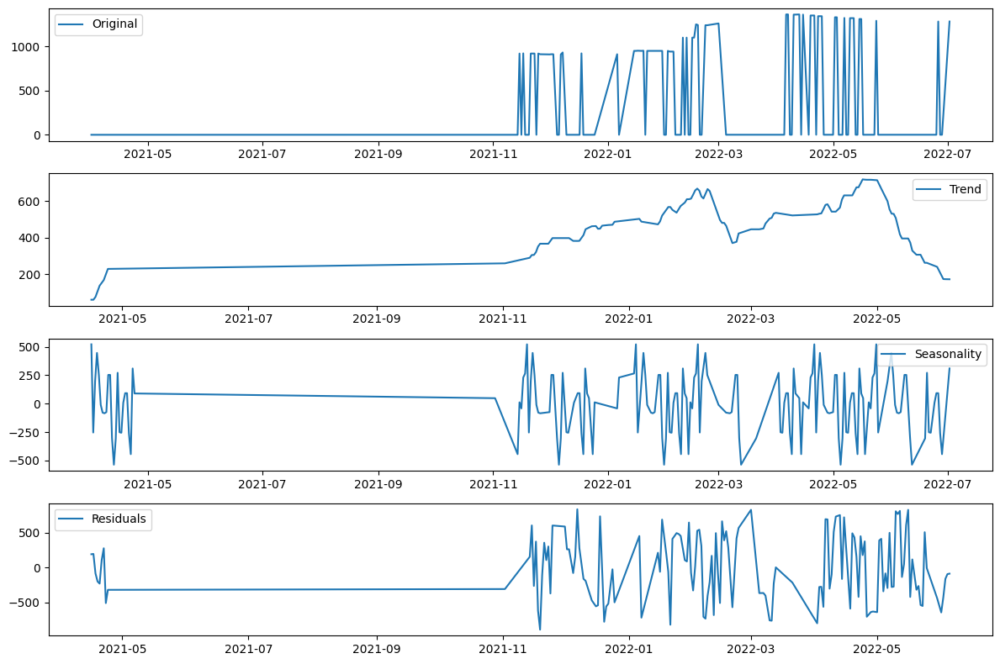

Differencing applied to column: AA1_91_9500062414


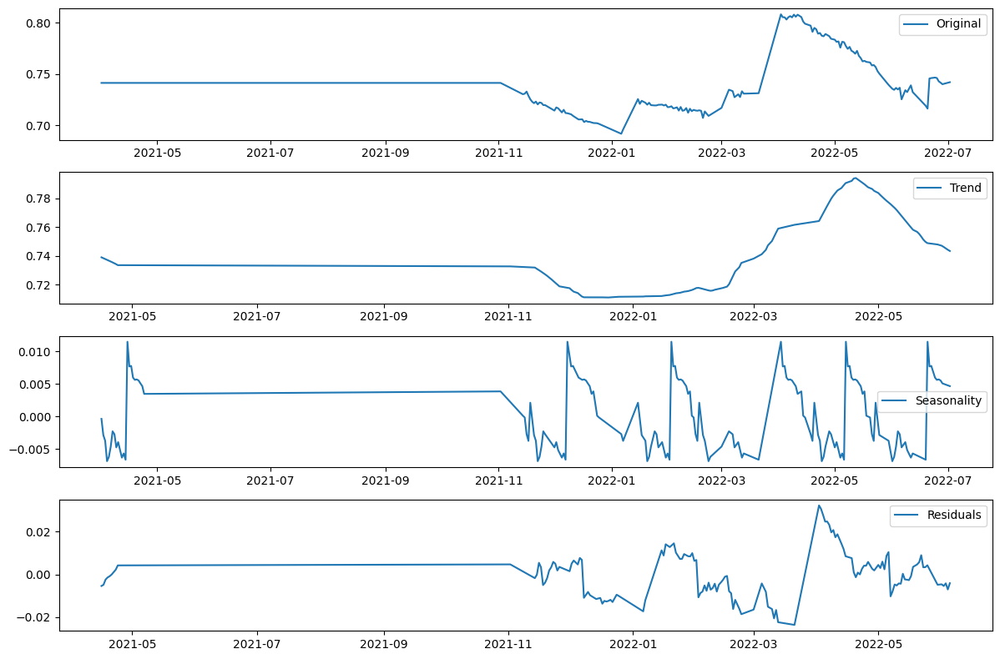

Differencing applied to column: AA1_91_EP_NATURAL_GAS


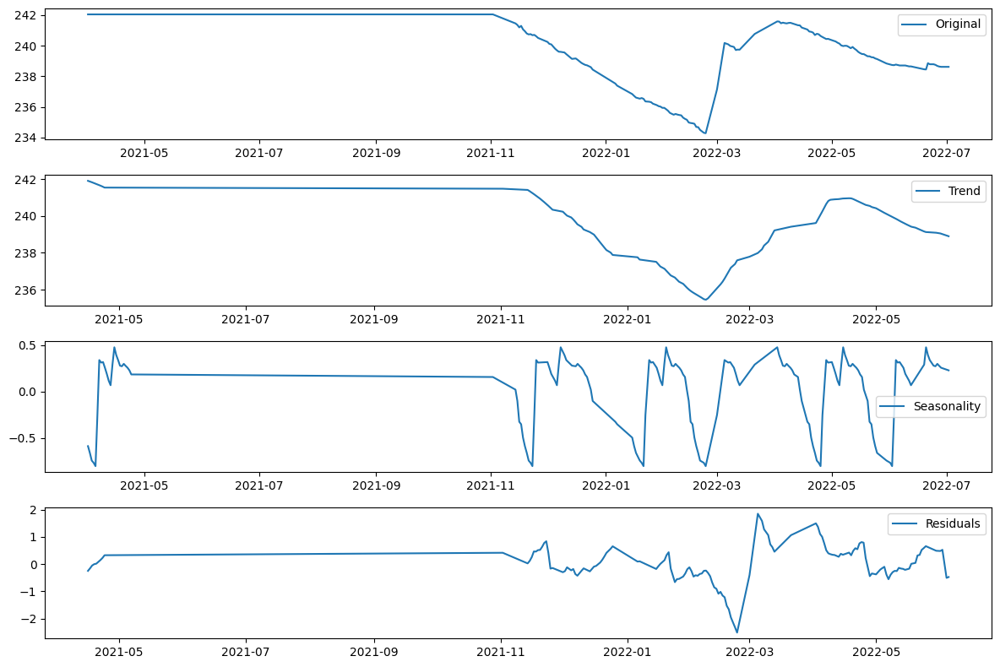

Differencing applied to column: AA1_ANPR


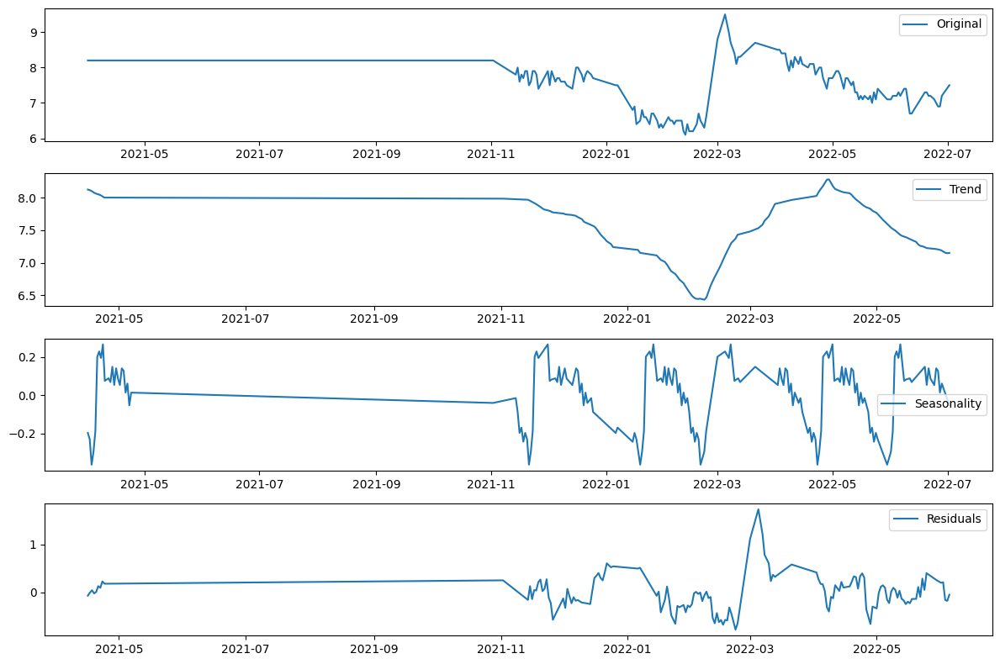

Differencing applied to column: AA1_ANTP


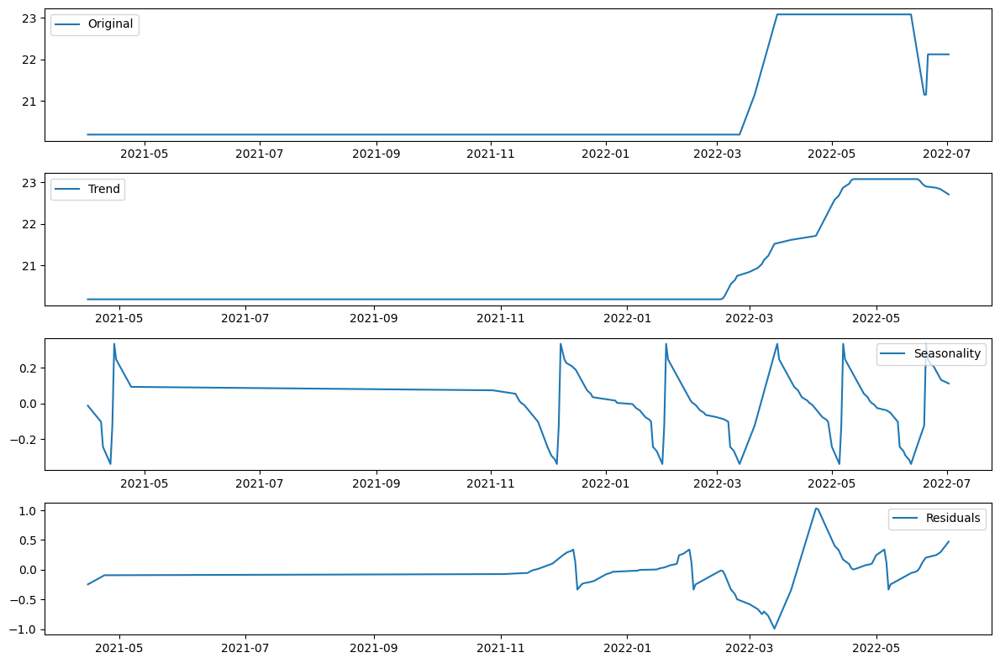

Differencing applied to column: AA1_C_OP


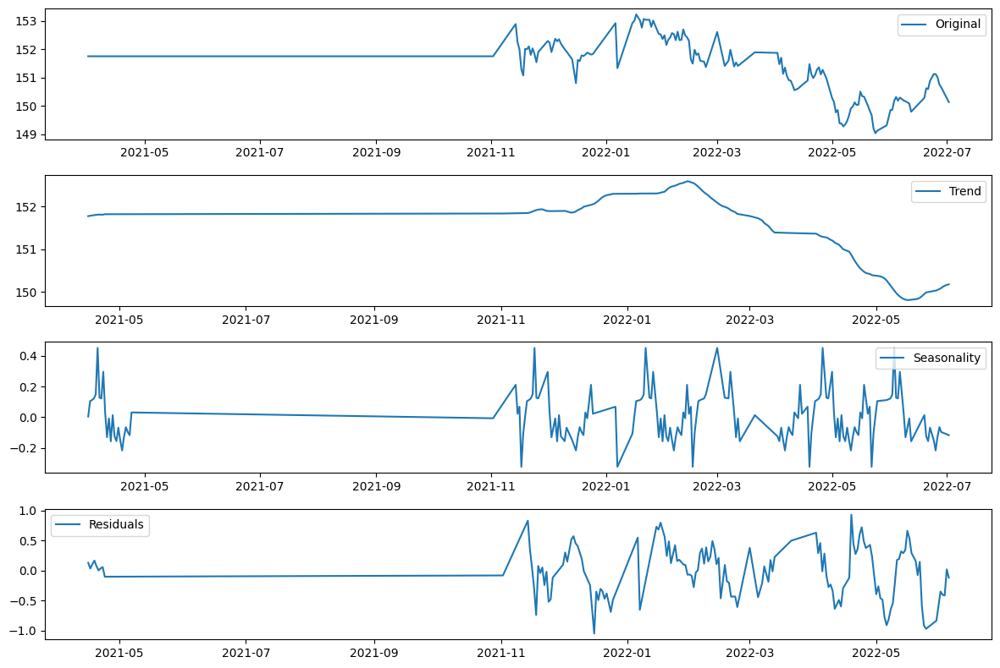

Differencing applied to column: AA1_C_PR


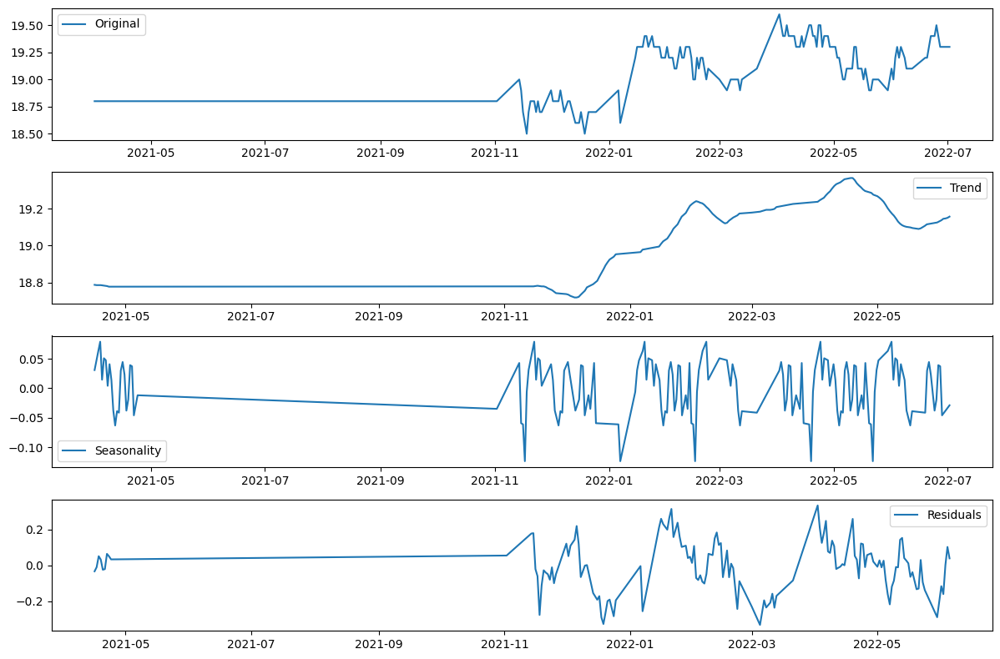

Differencing applied to column: AA1_C_TE


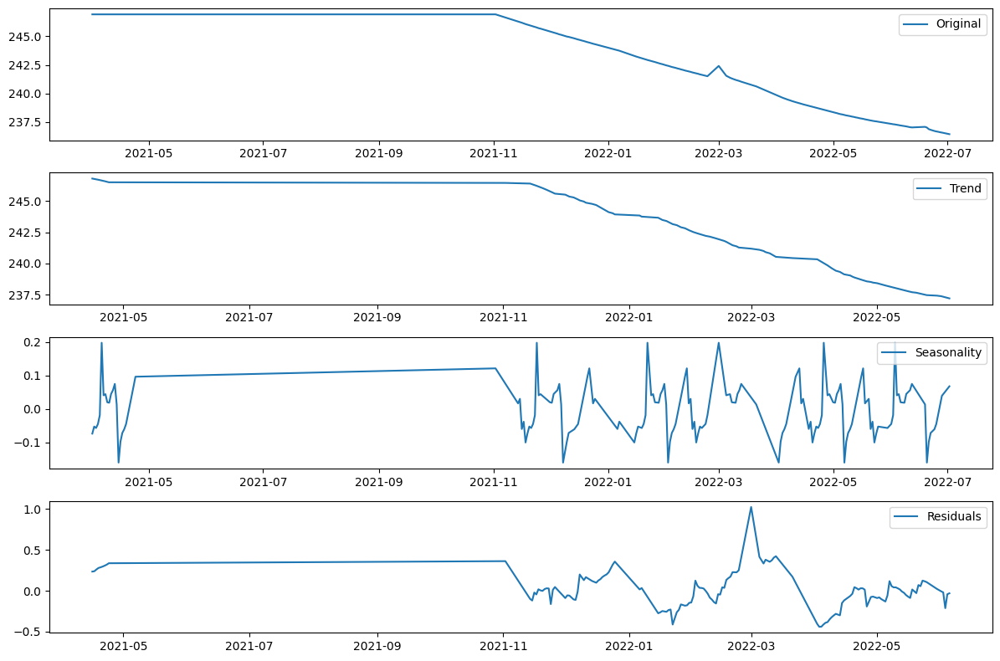

Differencing applied to column: AA1_FBHP


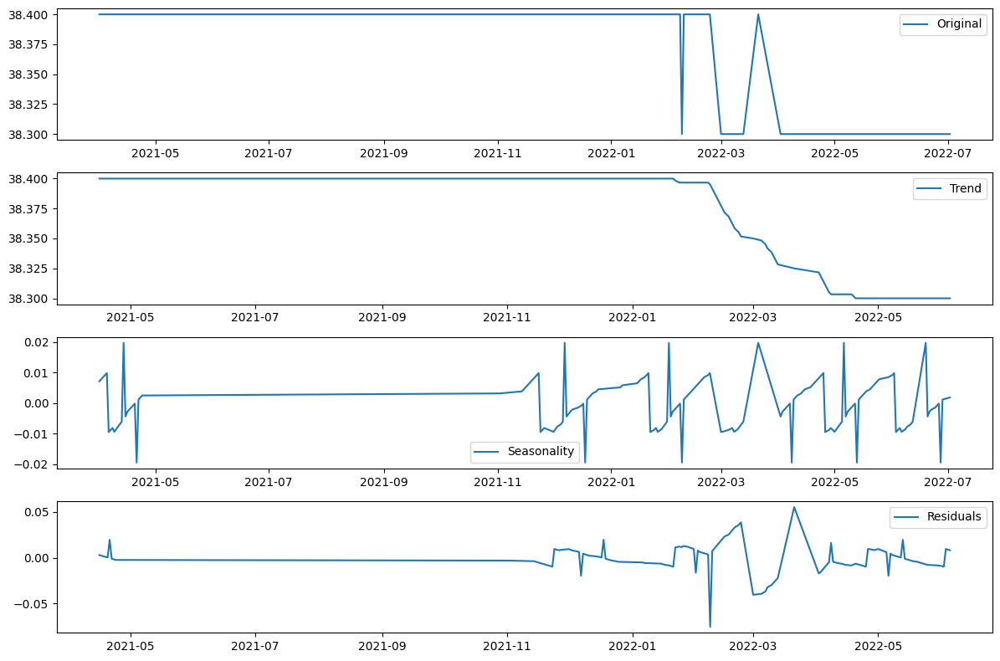

Differencing applied to column: AA1_FBHT


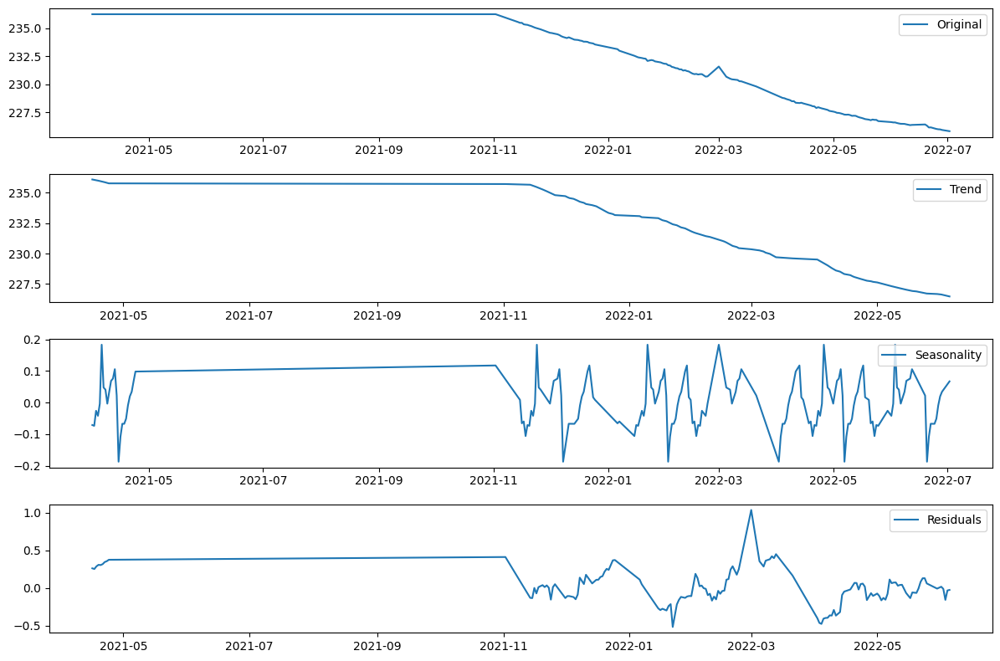

Differencing applied to column: AA1_FTHP


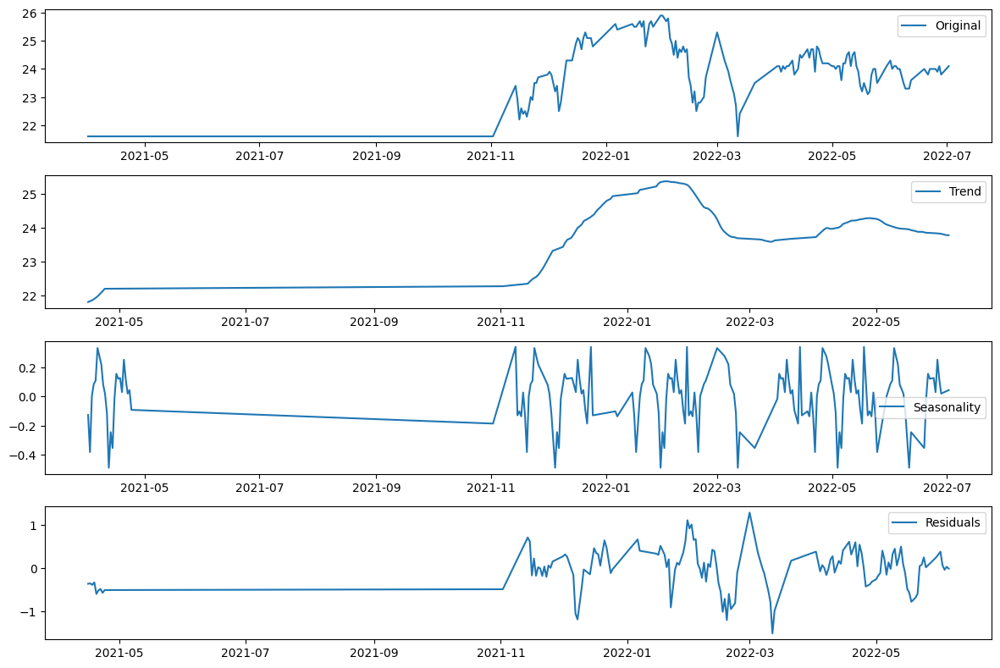

Differencing applied to column: AA1_FTHT


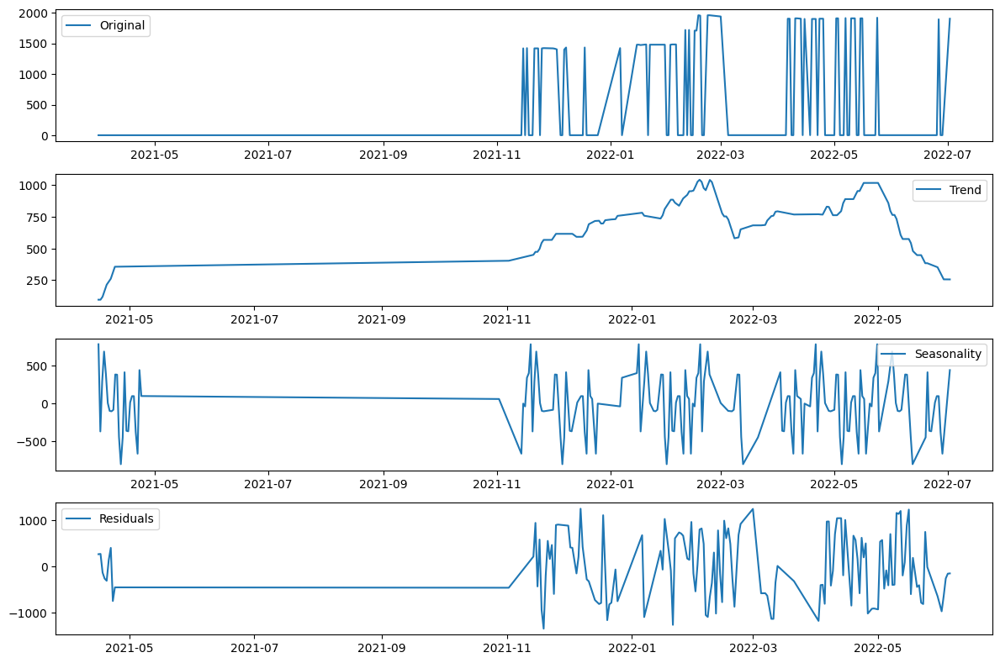

Differencing applied to column: AA2_91_9500062414


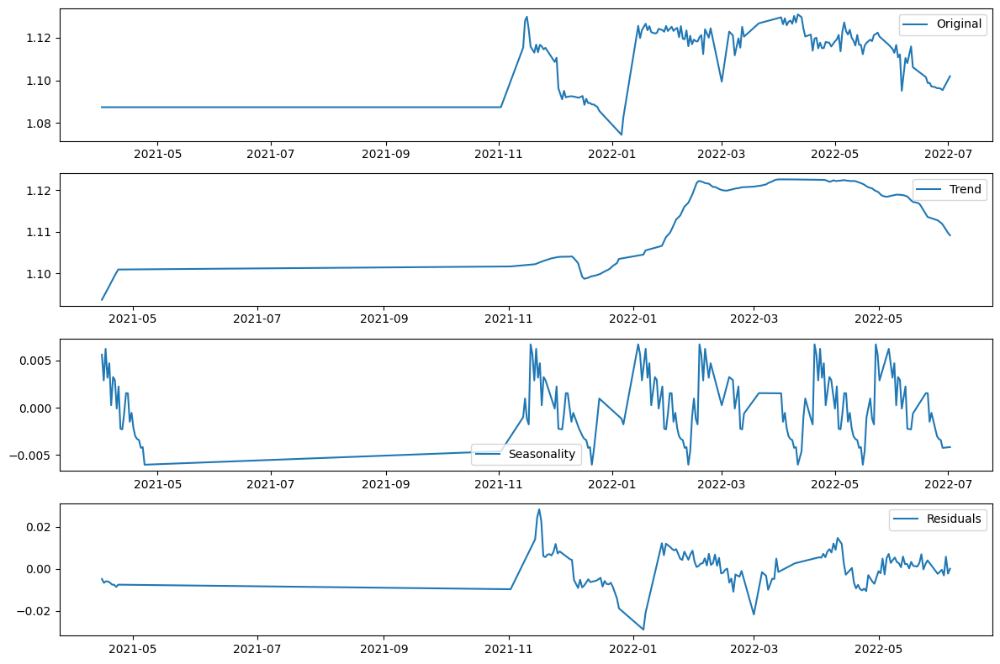

Differencing applied to column: AA2_91_EP_NATURAL_GAS


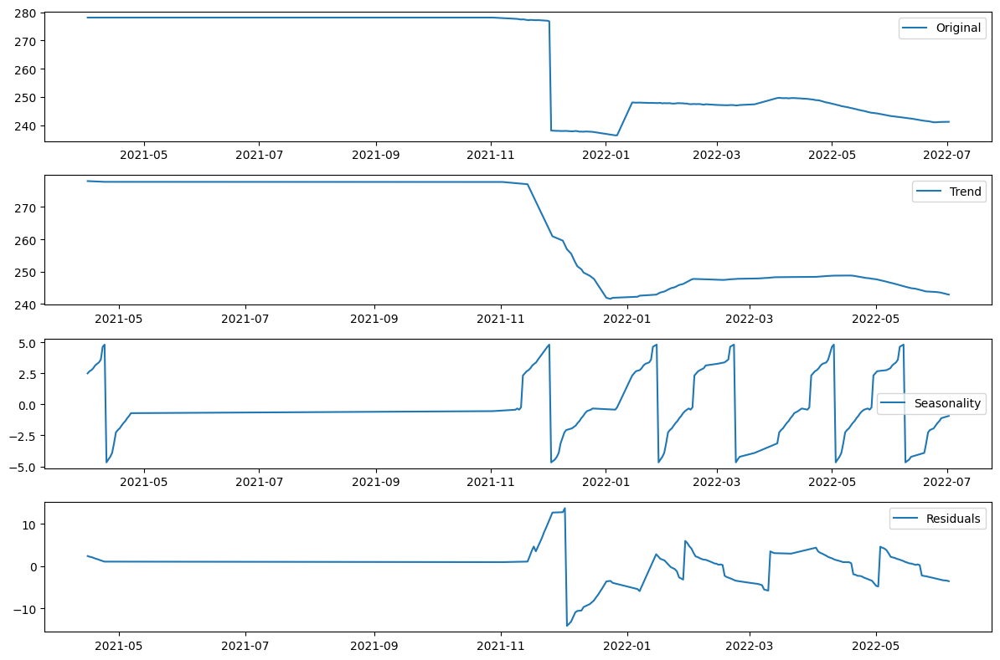

Differencing applied to column: AA2_ANPR


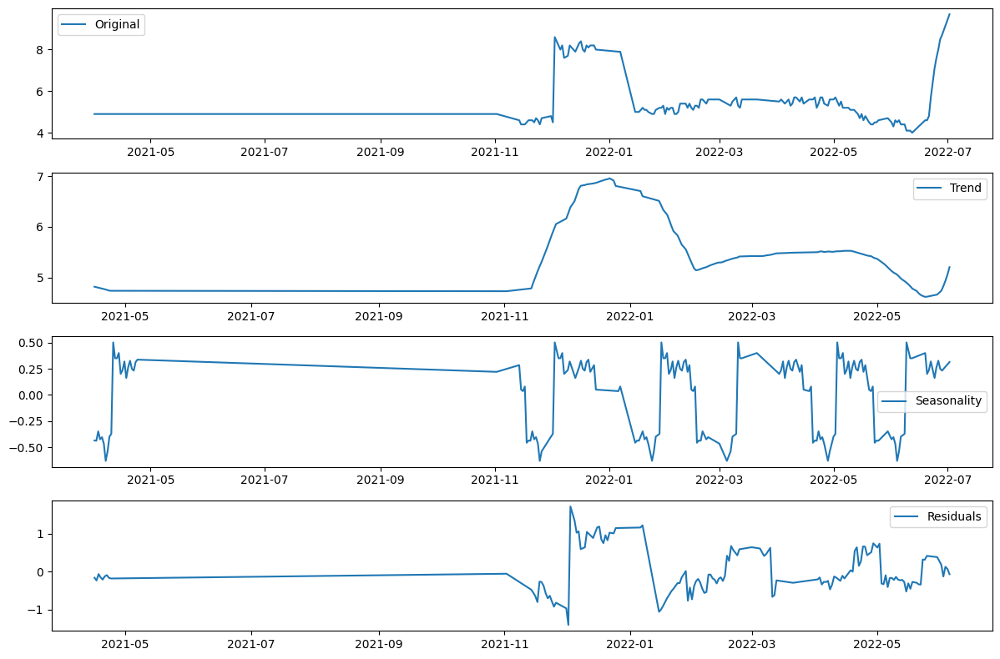

Differencing applied to column: AA2_ANTP


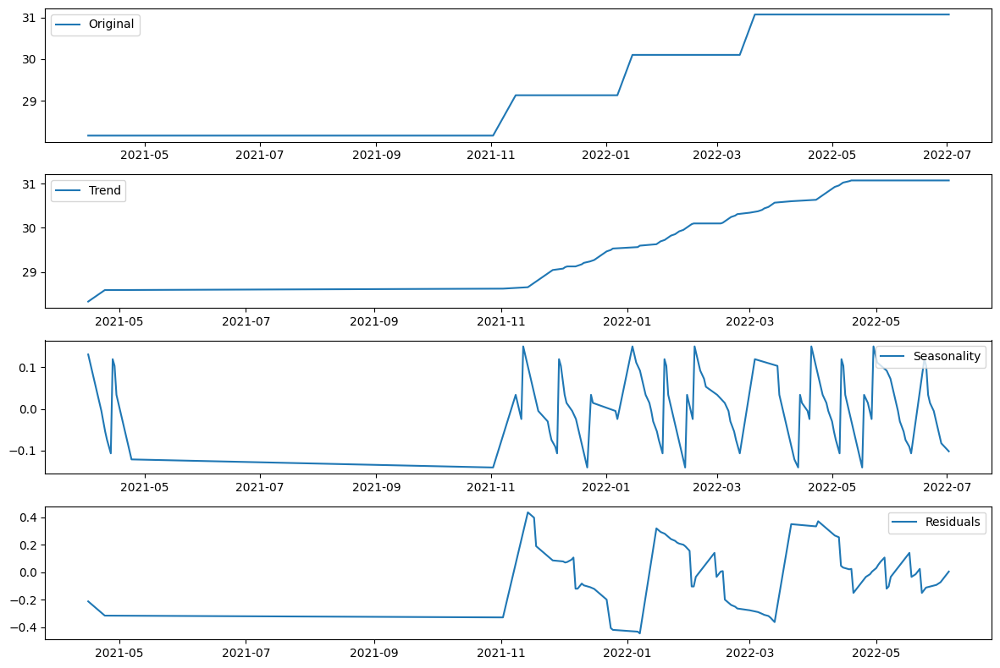

Differencing applied to column: AA2_C_OP


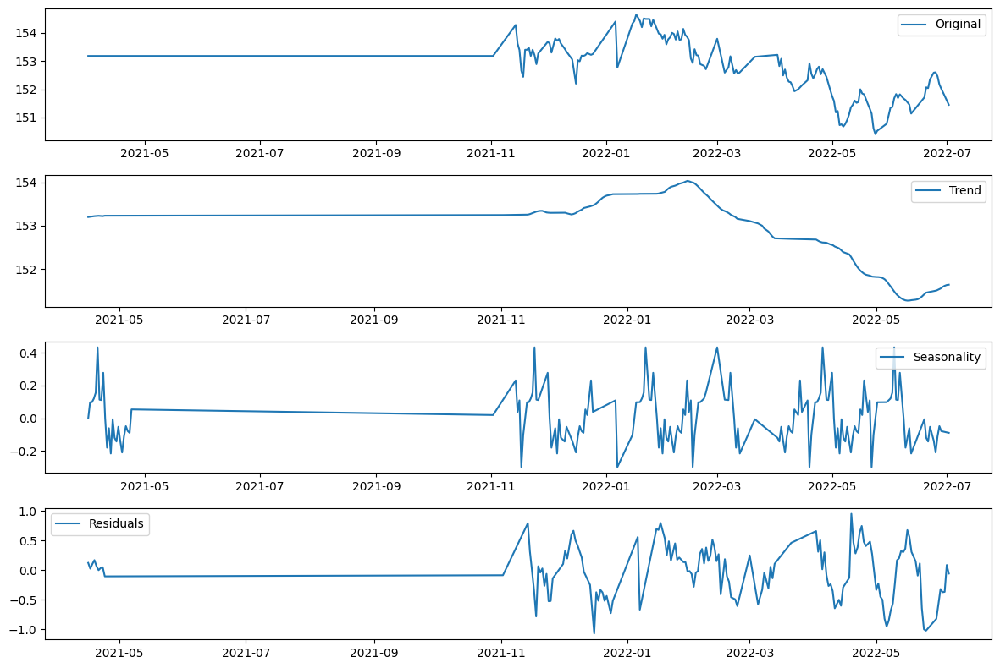

Differencing applied to column: AA2_C_PR


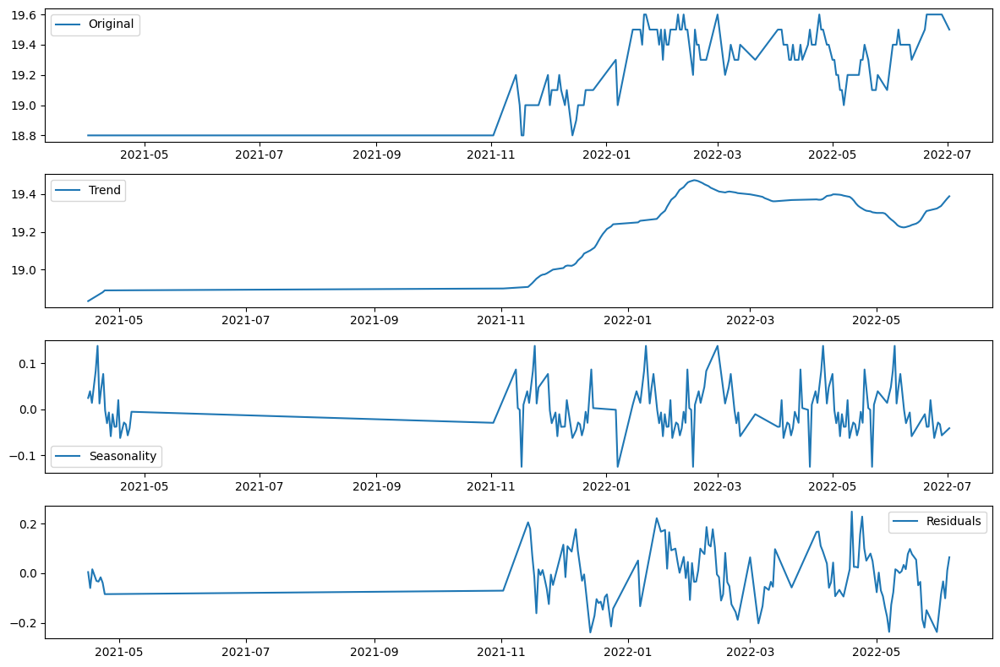

Differencing applied to column: AA2_C_TE


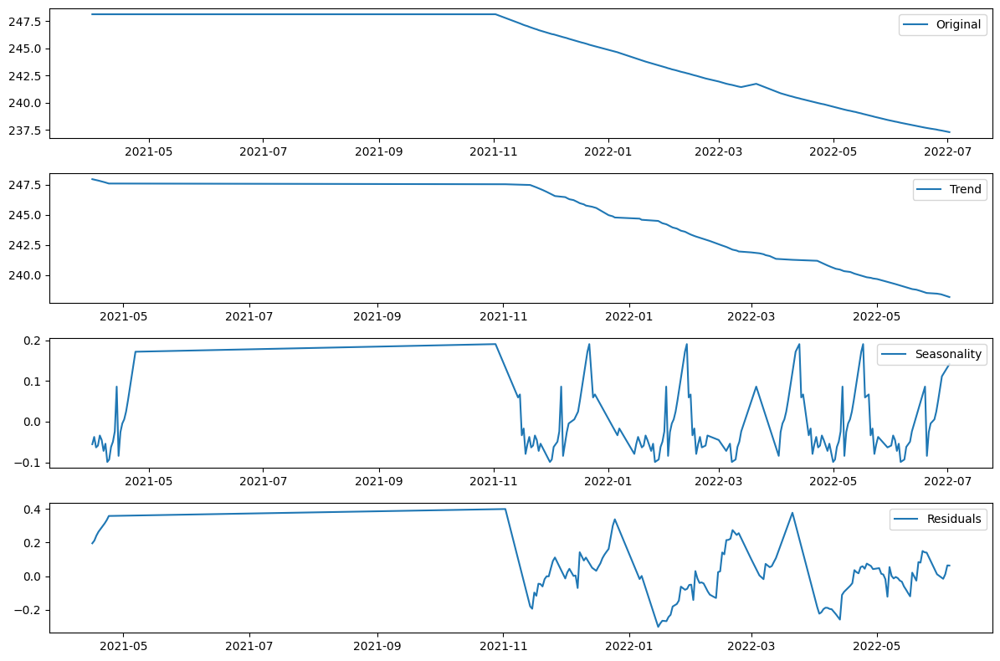

Differencing applied to column: AA2_FBHP


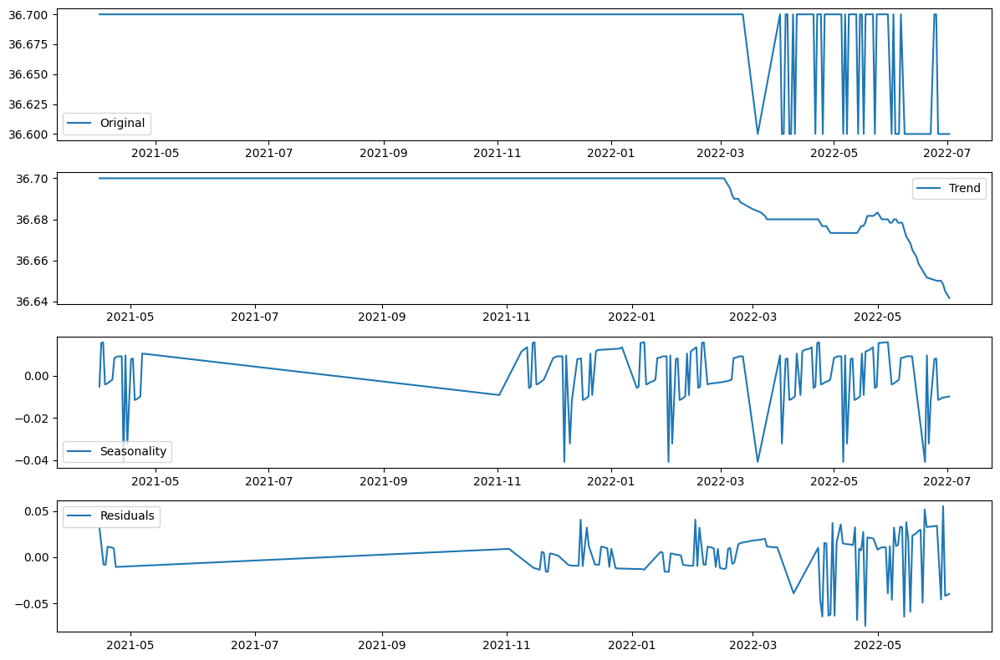

Differencing applied to column: AA2_FBHT


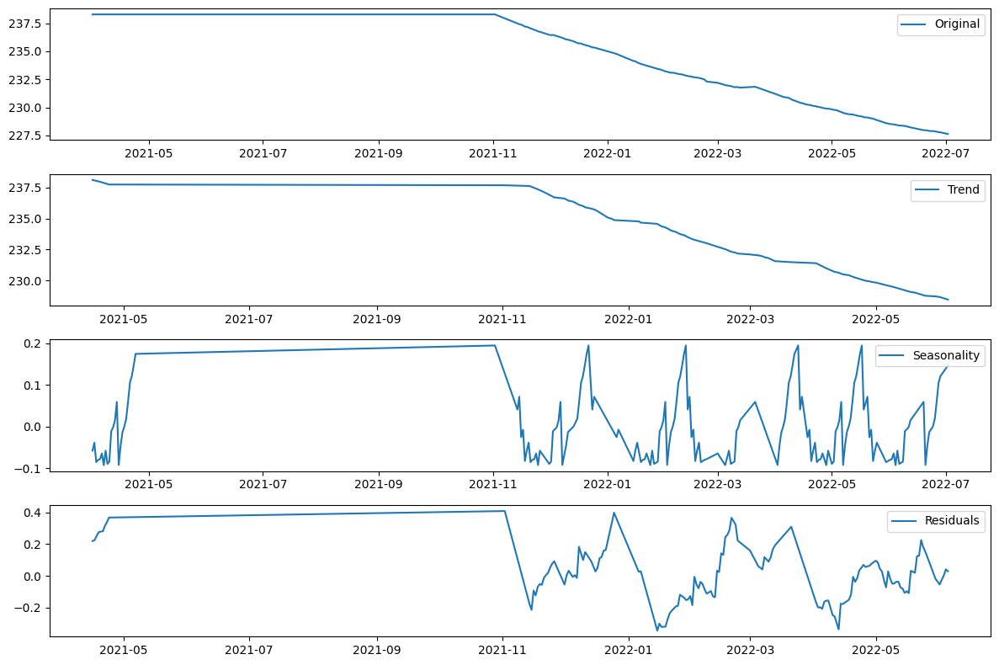

Differencing applied to column: AA2_FTHP


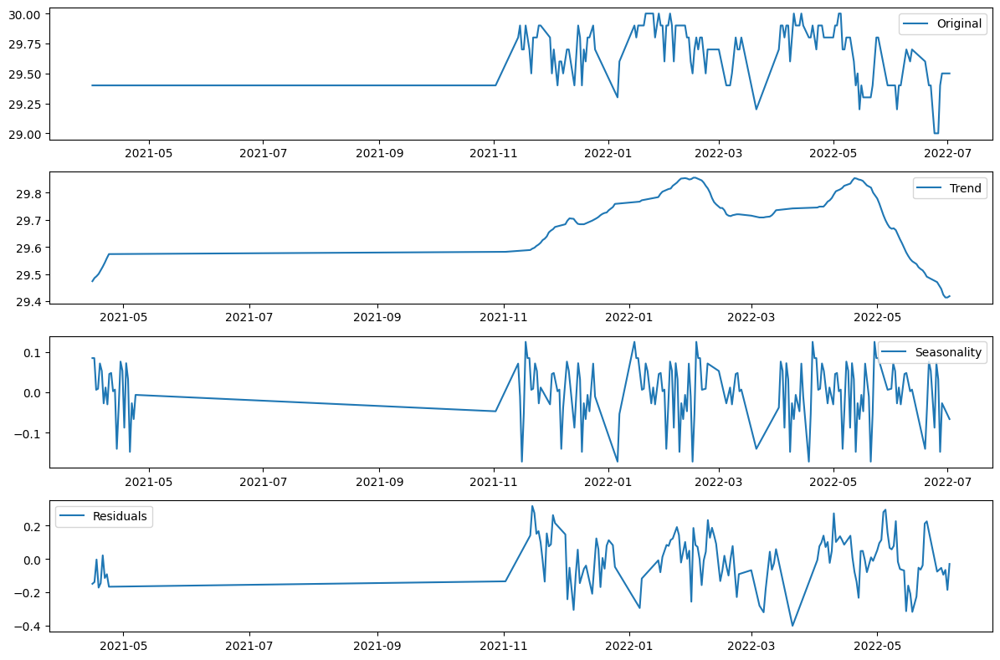

Differencing applied to column: AA2_FTHT


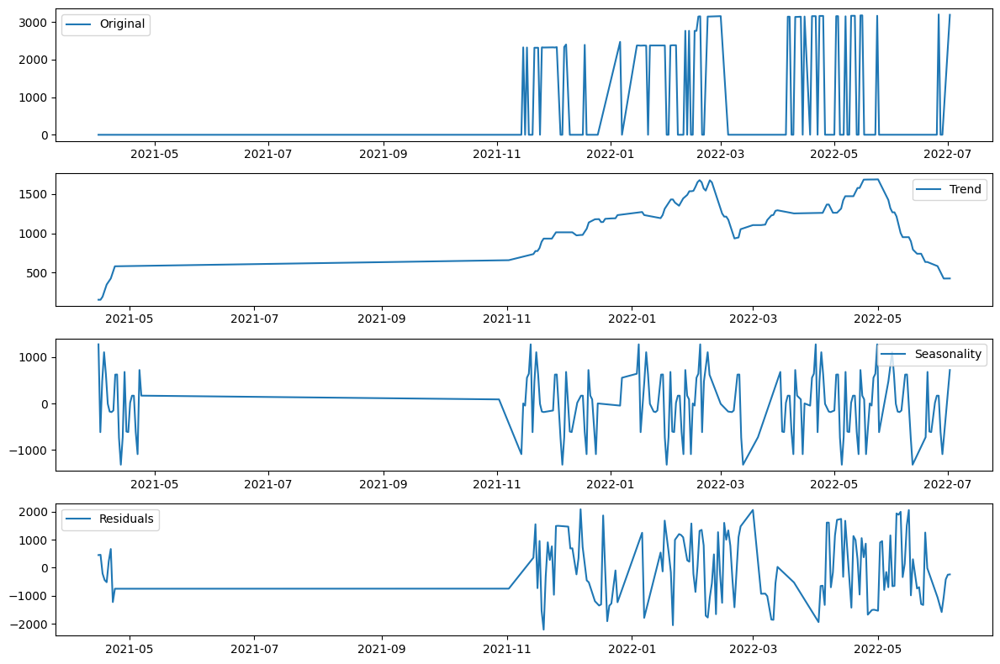

Differencing applied to column: AA3_91_9500062414


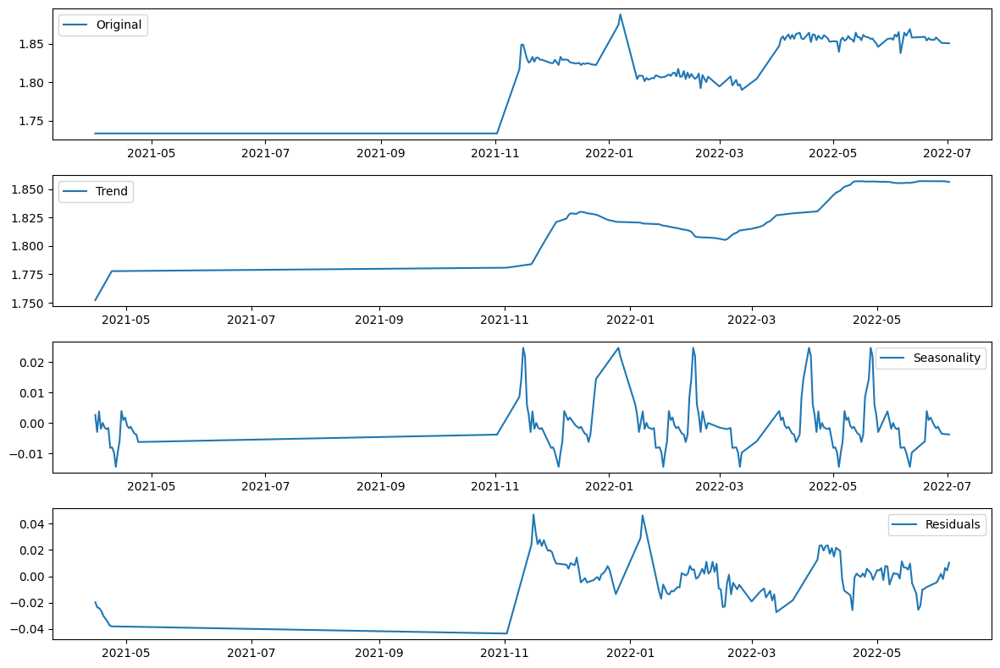

Differencing applied to column: AA3_91_EP_NATURAL_GAS


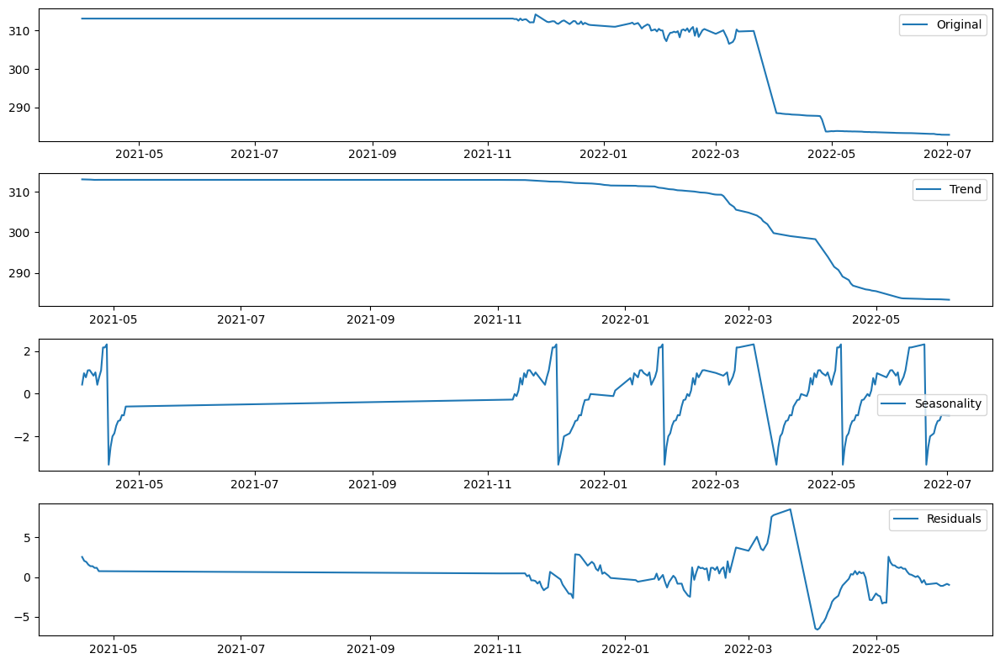

Differencing applied to column: AA3_ANPR


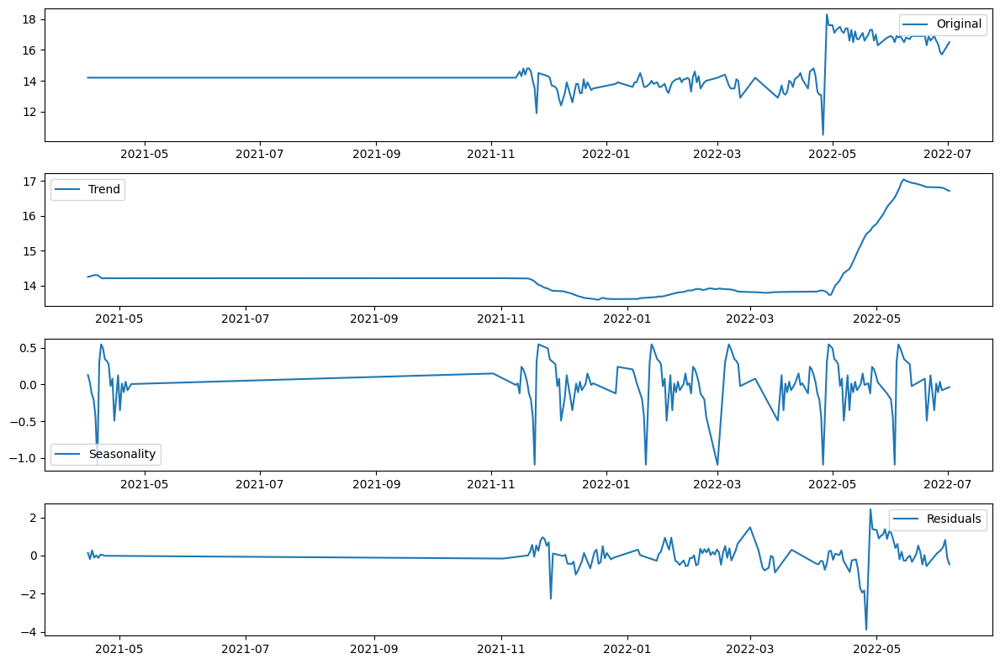

Differencing applied to column: AA3_ANTP


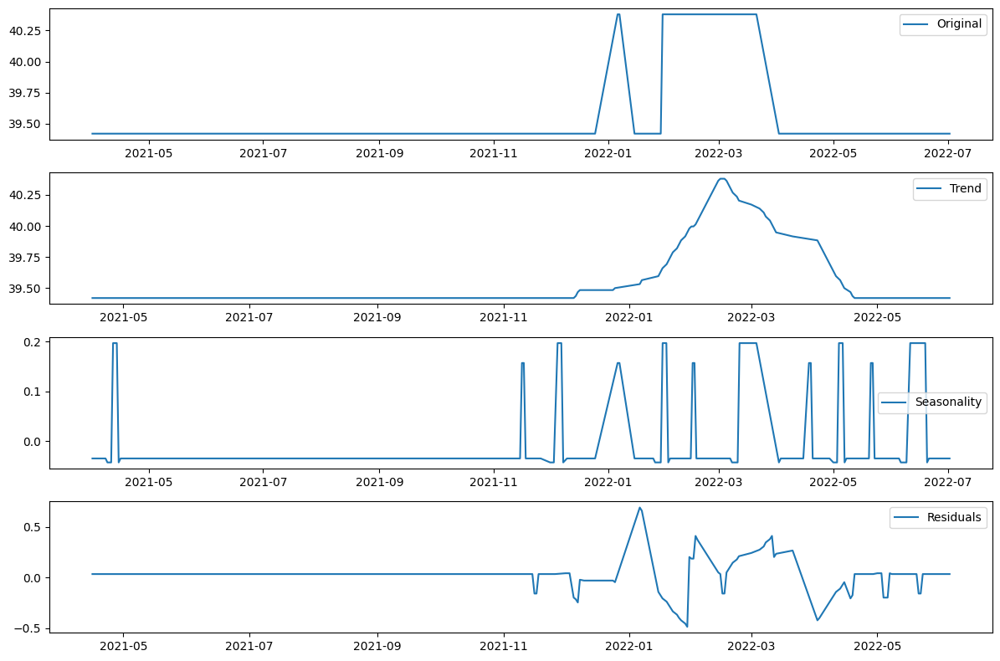

Differencing applied to column: AA3_C_OP


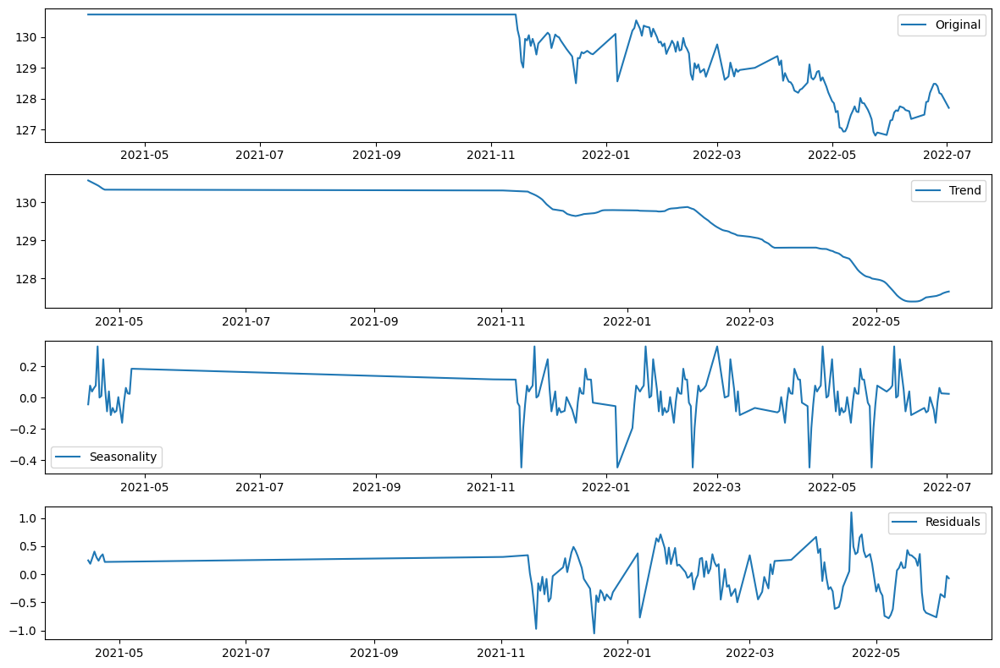

Differencing applied to column: AA3_C_PR


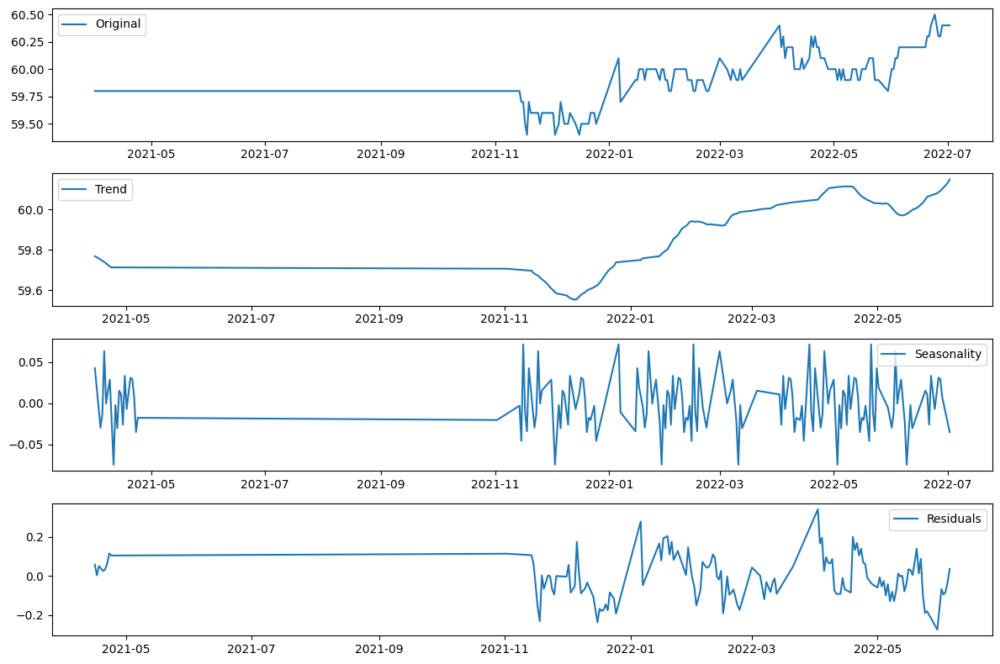

Differencing applied to column: AA3_C_TE


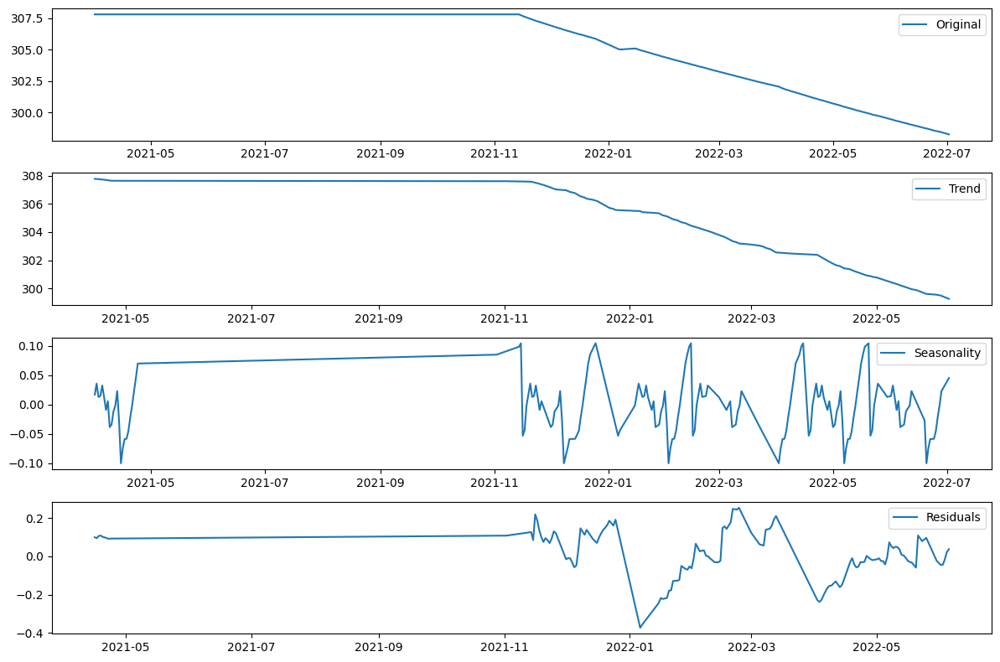

Differencing applied to column: AA3_FBHP


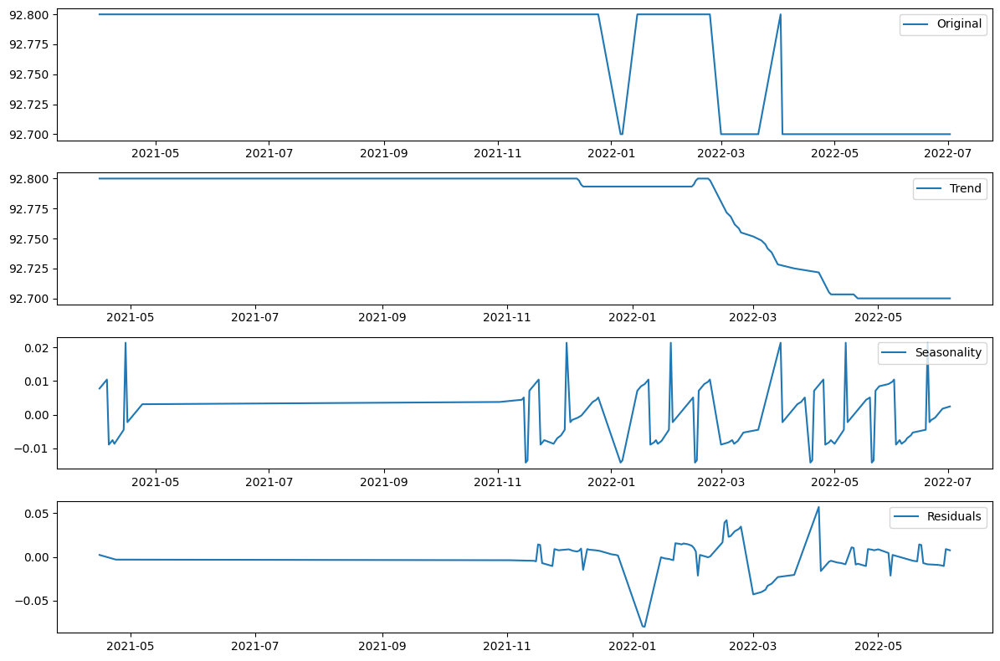

Differencing applied to column: AA3_FBHT


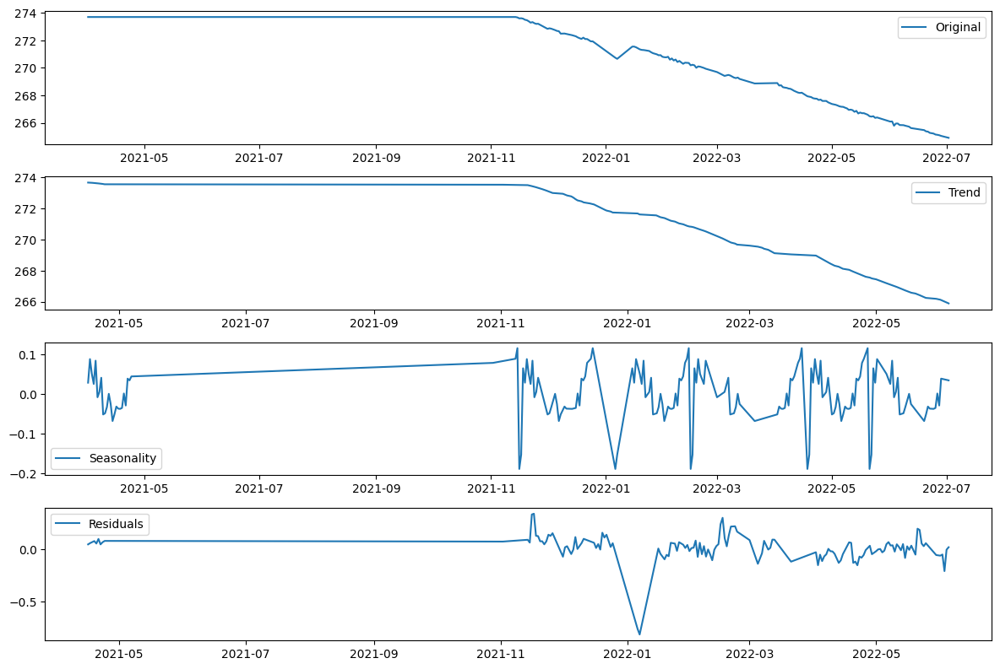

Differencing applied to column: AA3_FTHP


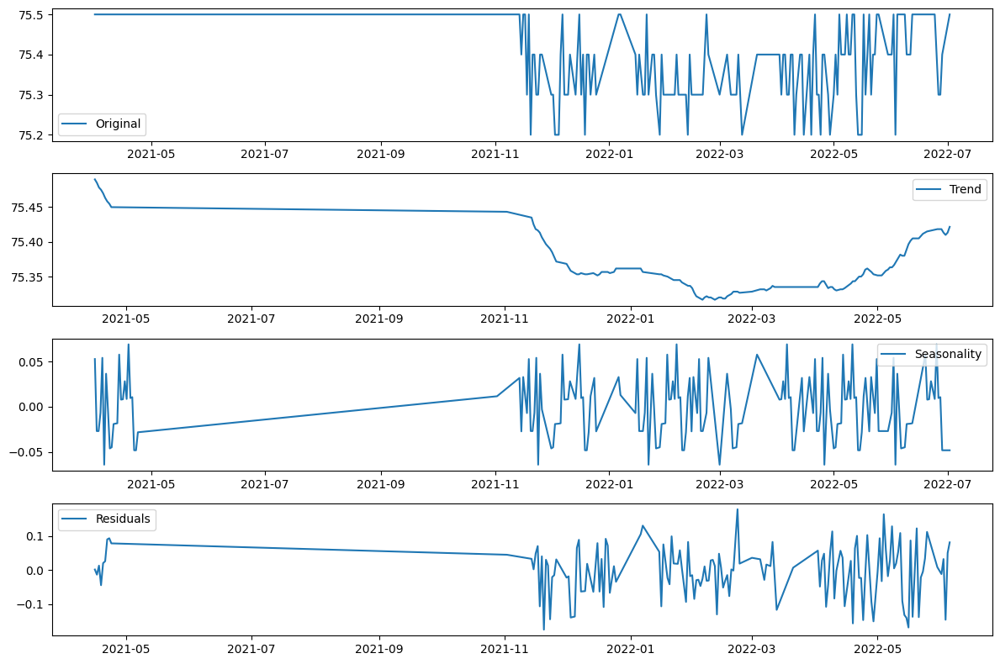

Differencing applied to column: AA3_FTHT


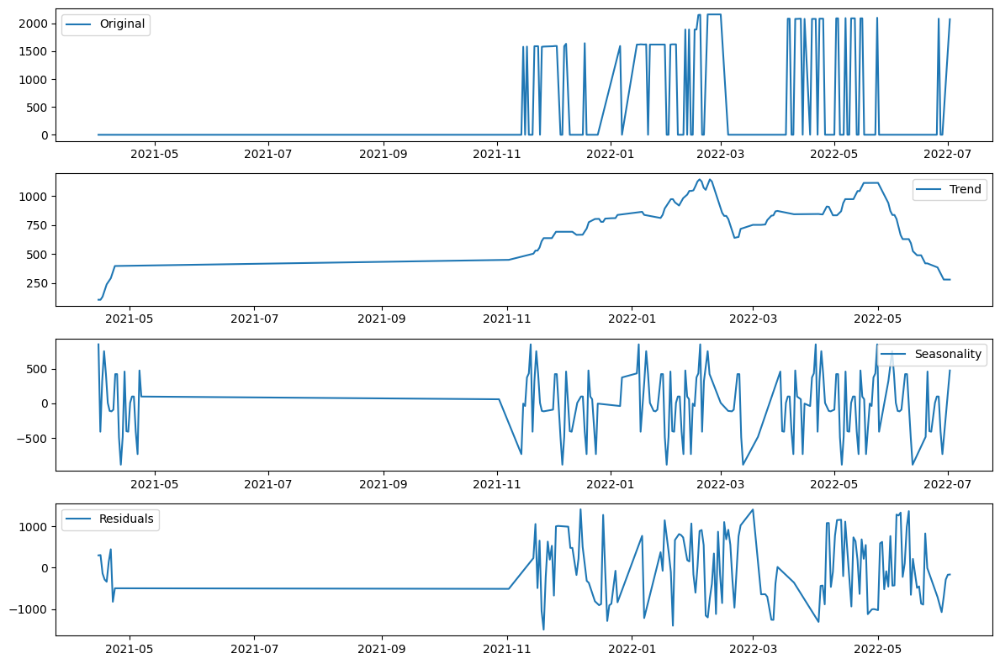

Differencing applied to column: AA4_91_9500062414


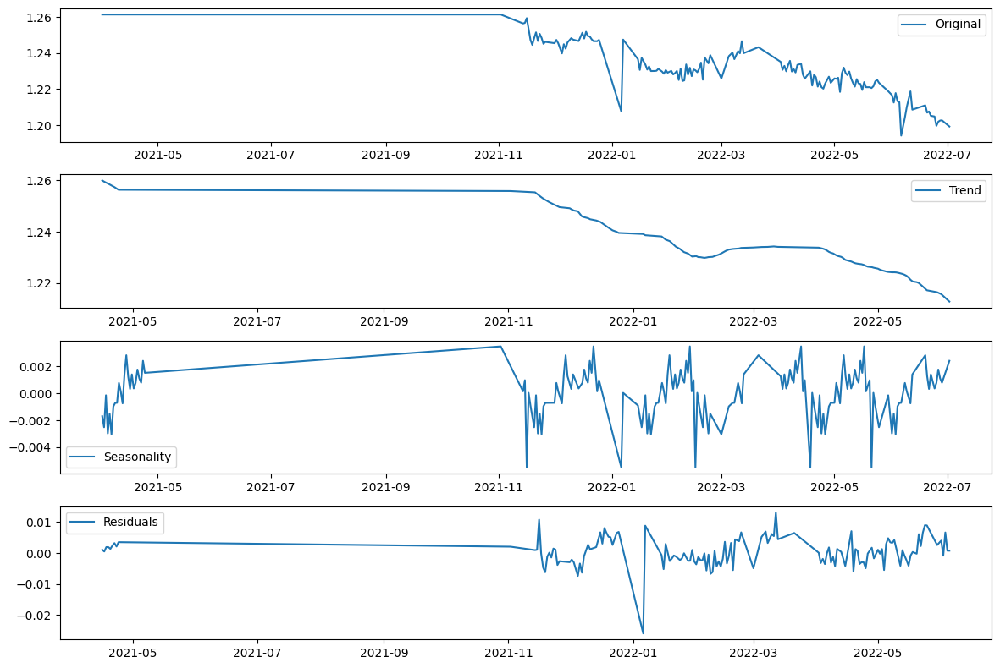

Differencing applied to column: AA4_91_EP_NATURAL_GAS


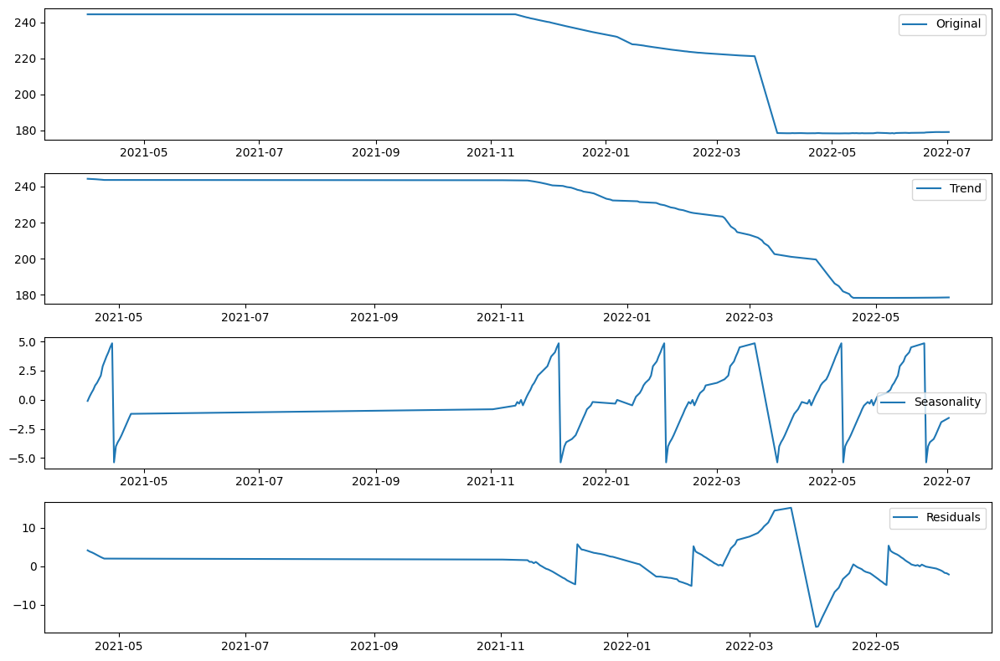

Differencing applied to column: AA4_ANPR


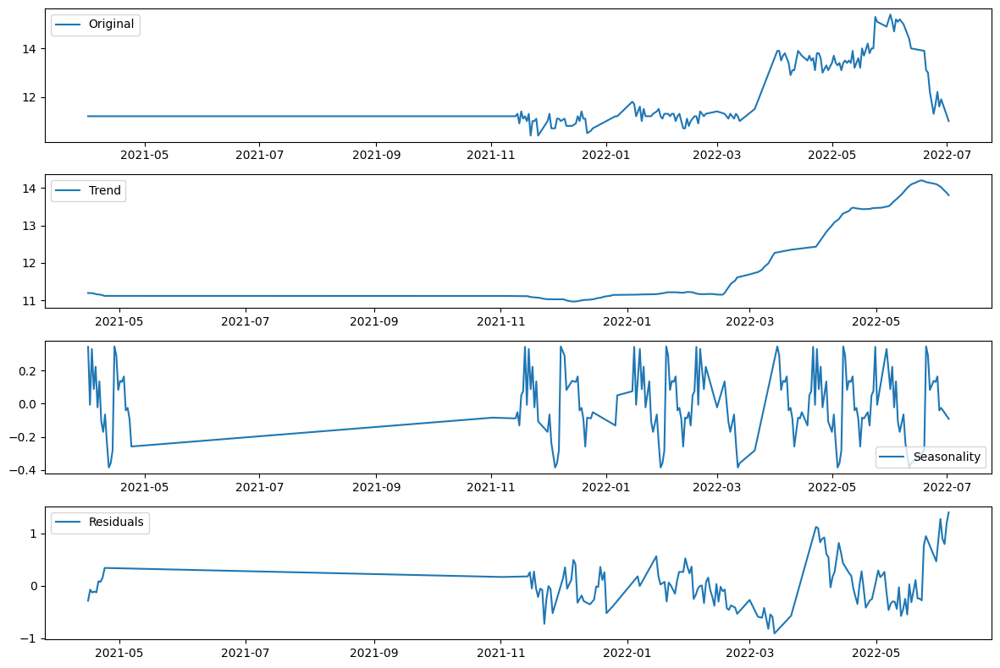

Differencing applied to column: AA4_ANTP


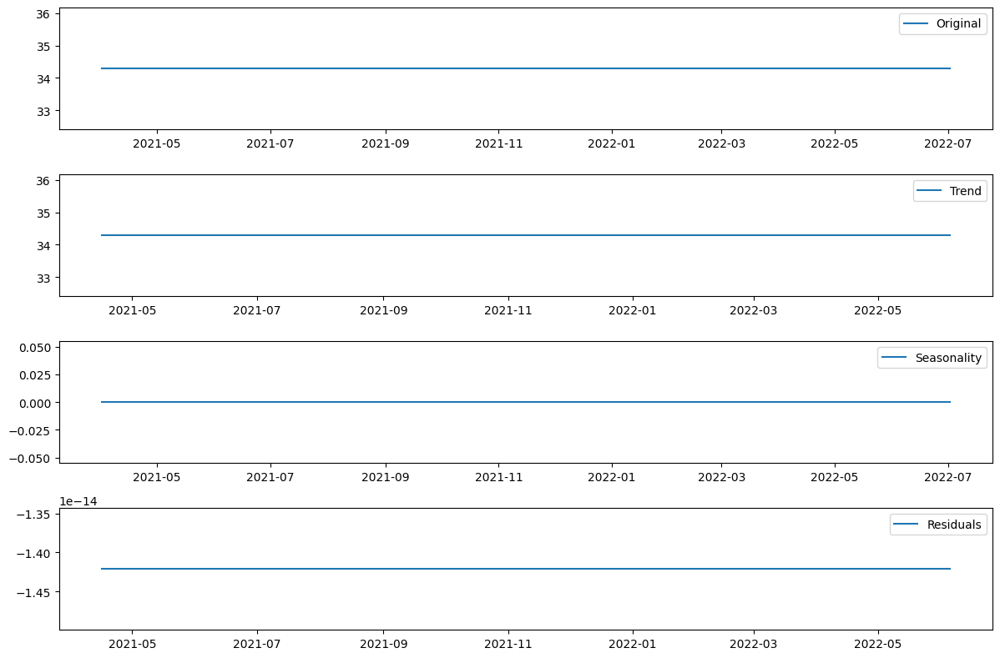

Differencing applied to column: AA4_C_OP


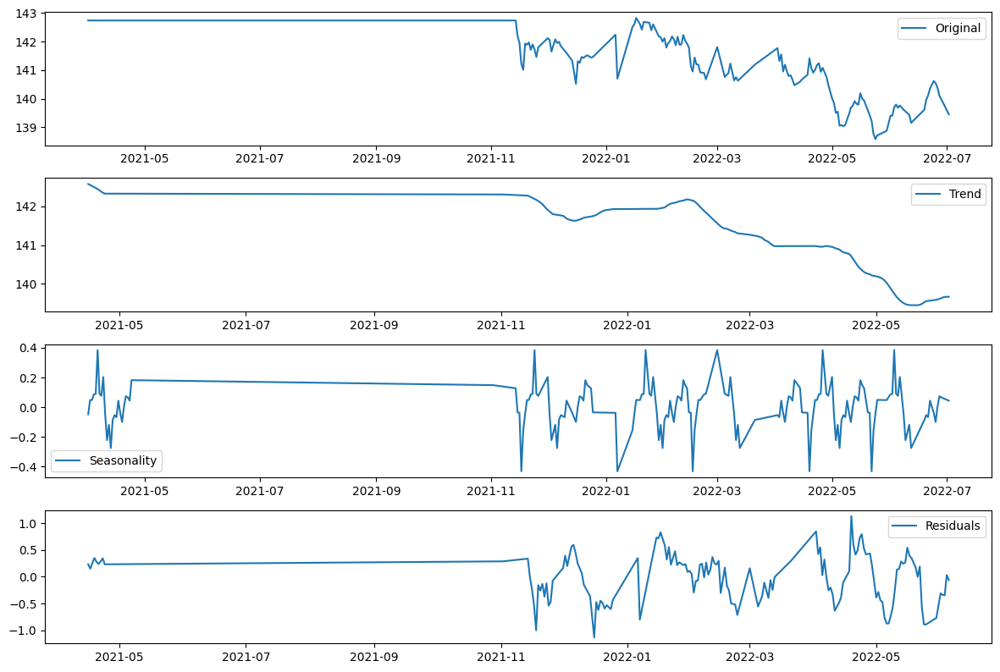

Differencing applied to column: AA4_C_PR


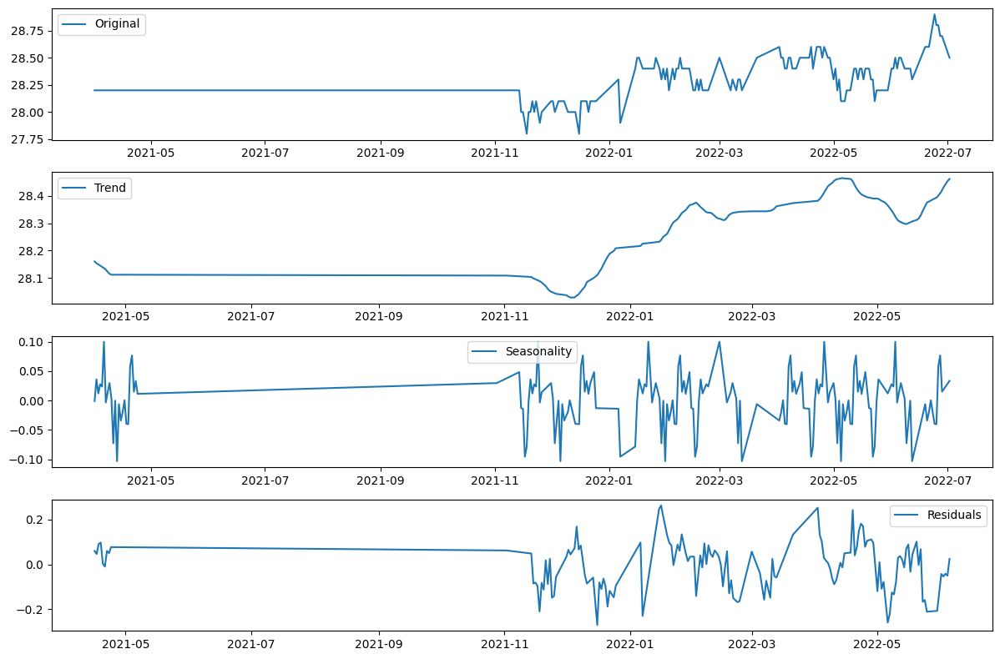

Differencing applied to column: AA4_C_TE


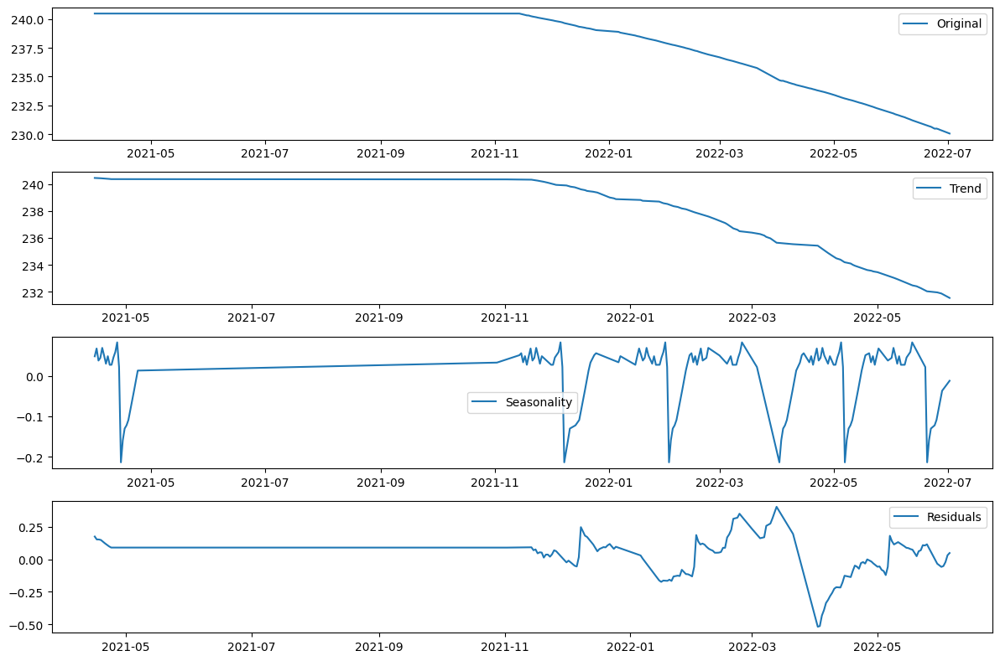

Differencing applied to column: AA4_FBHP


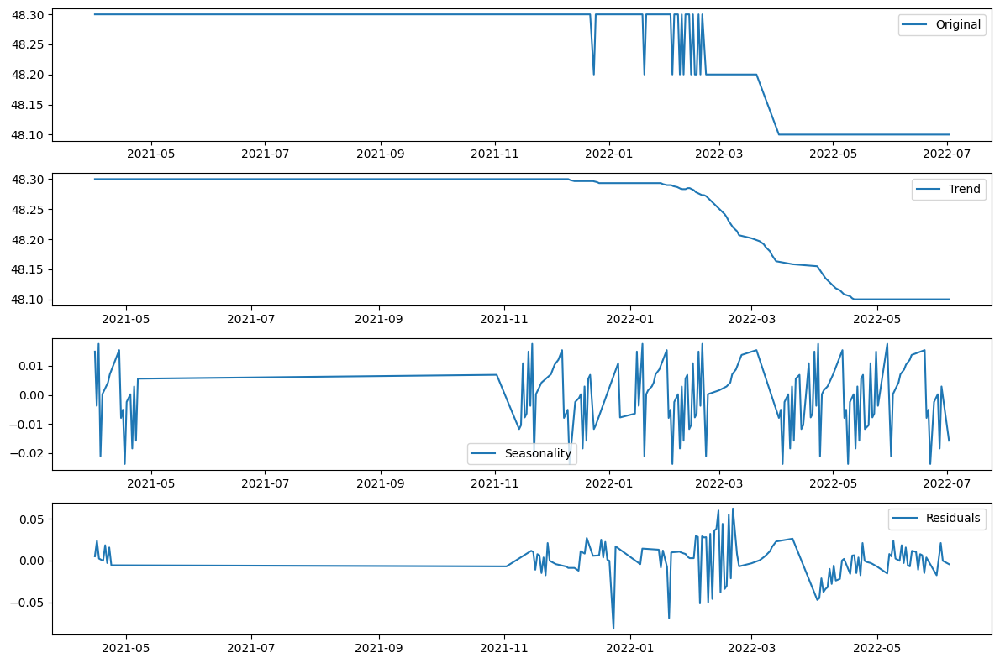

Differencing applied to column: AA4_FBHT


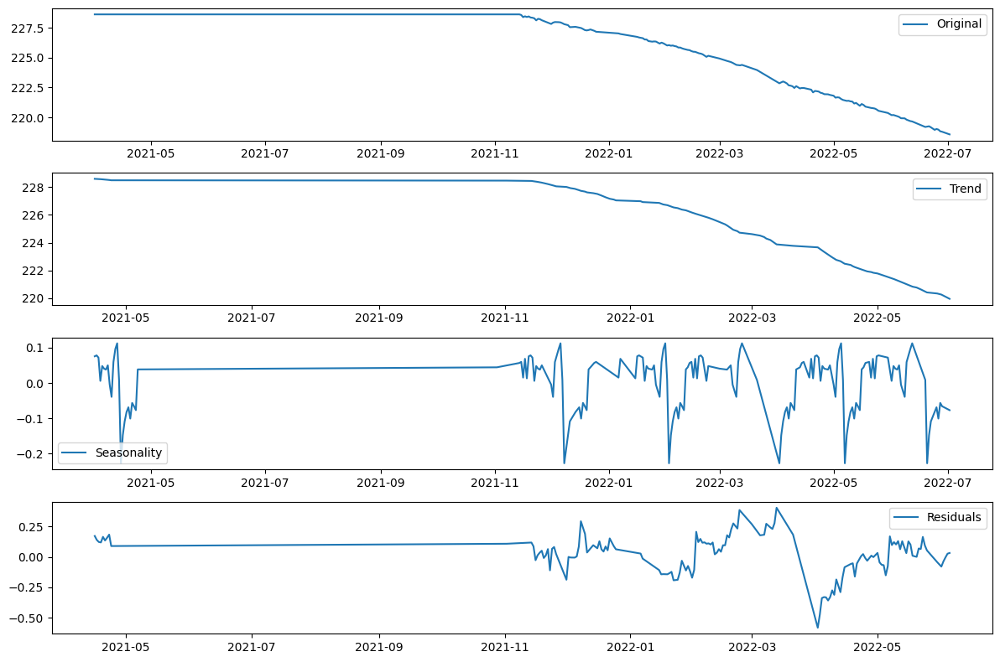

Differencing applied to column: AA4_FTHP


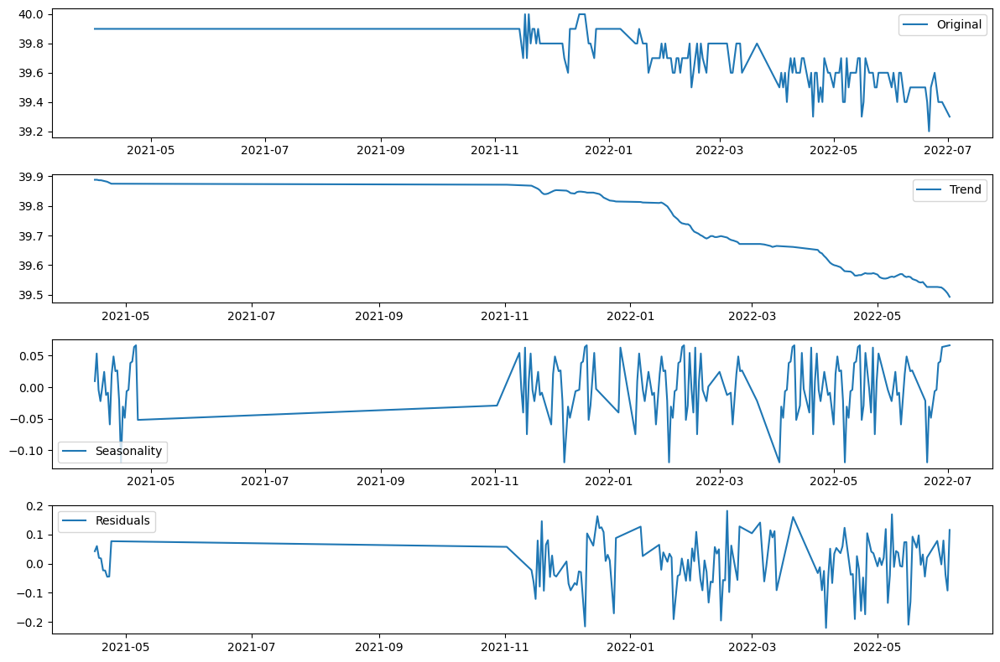

Differencing applied to column: AA4_FTHT


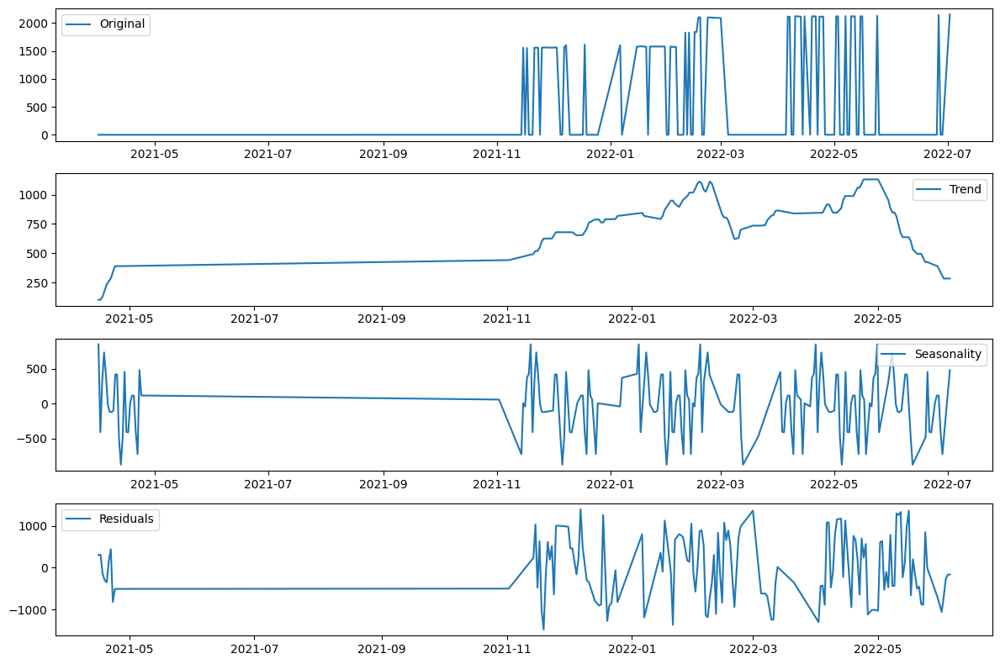

Differencing applied to column: AA5_91_9500062414


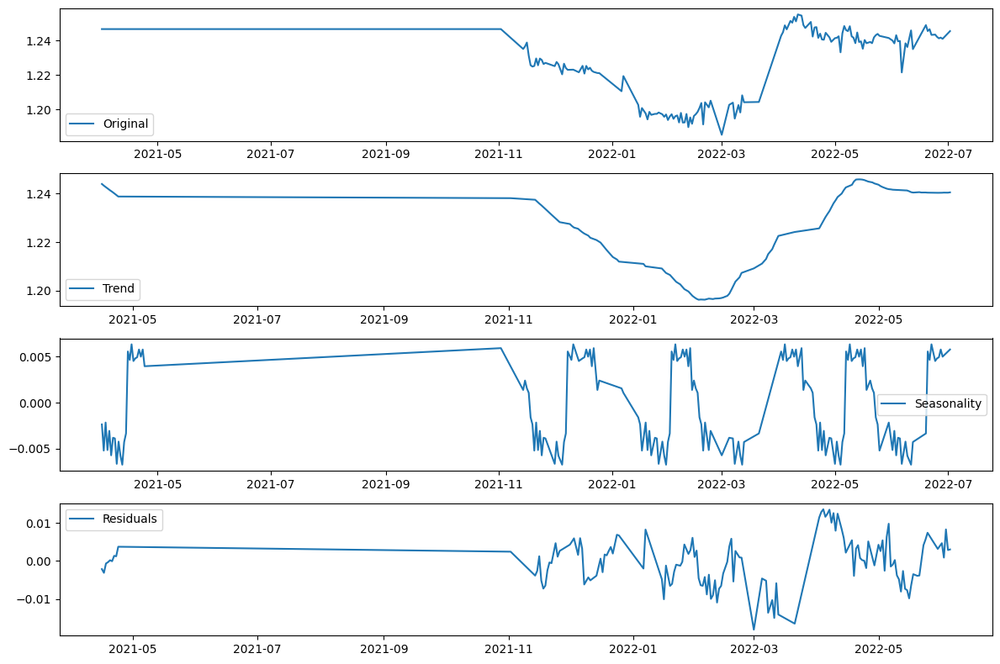

Differencing applied to column: AA5_91_EP_NATURAL_GAS


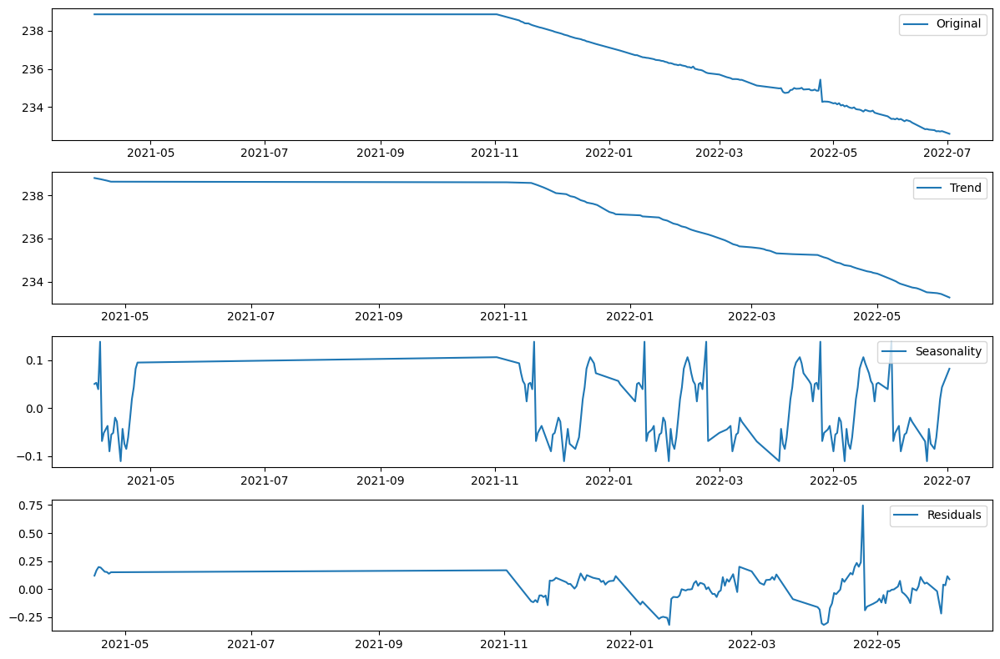

Differencing applied to column: AA5_ANPR


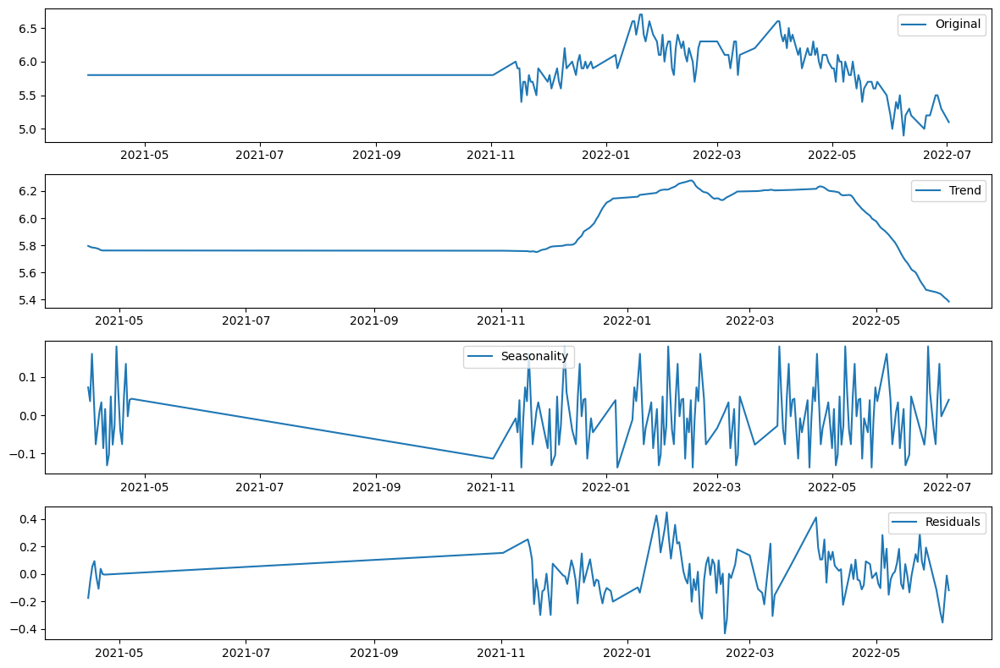

Differencing applied to column: AA5_ANTP


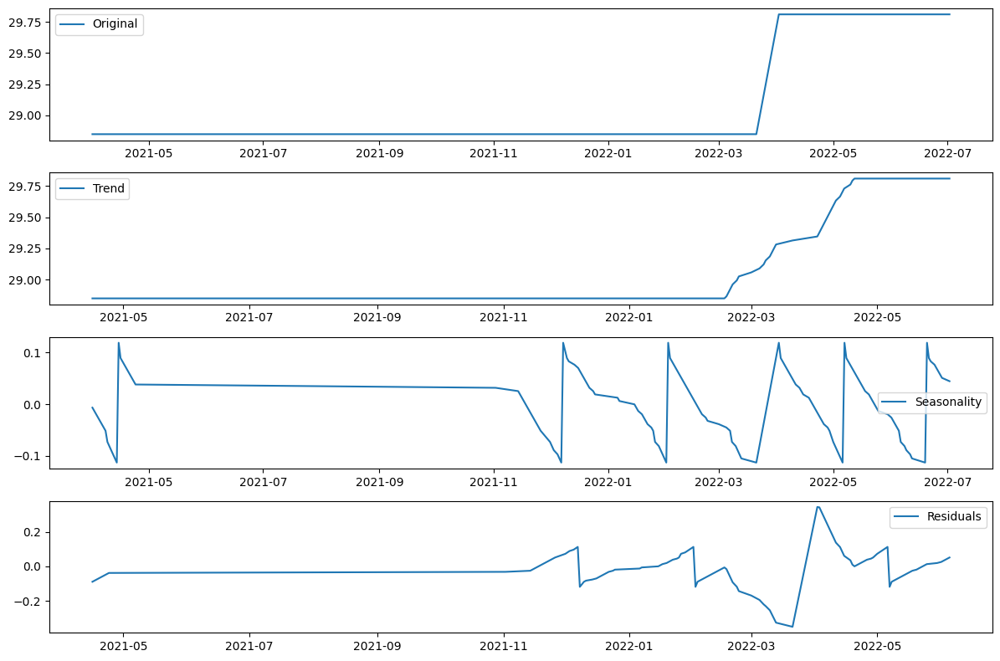

Differencing applied to column: AA5_C_OP


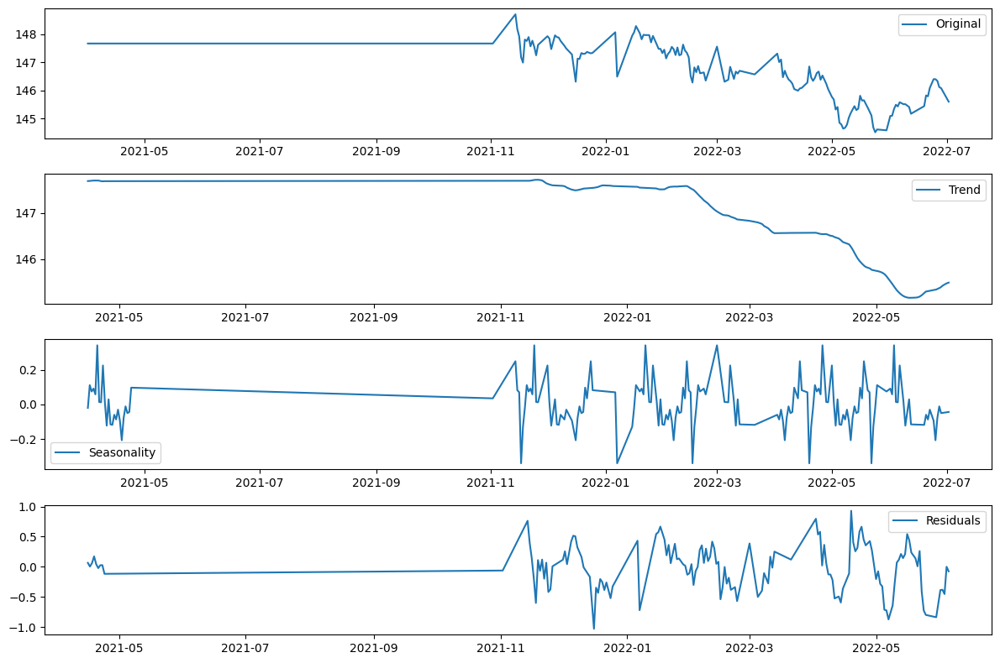

Differencing applied to column: AA5_C_PR


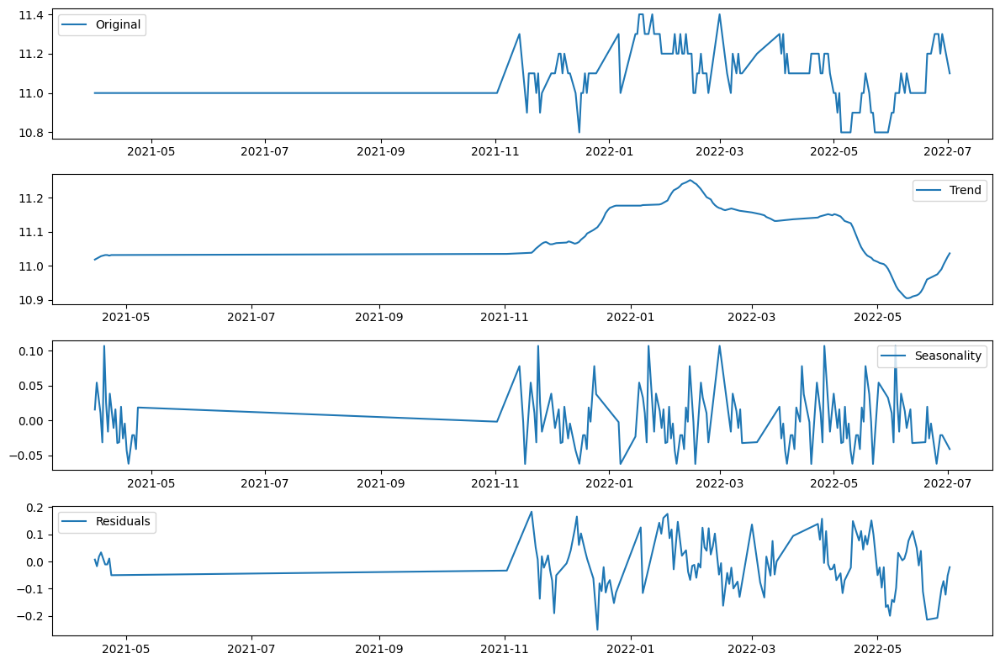

Differencing applied to column: AA5_C_TE


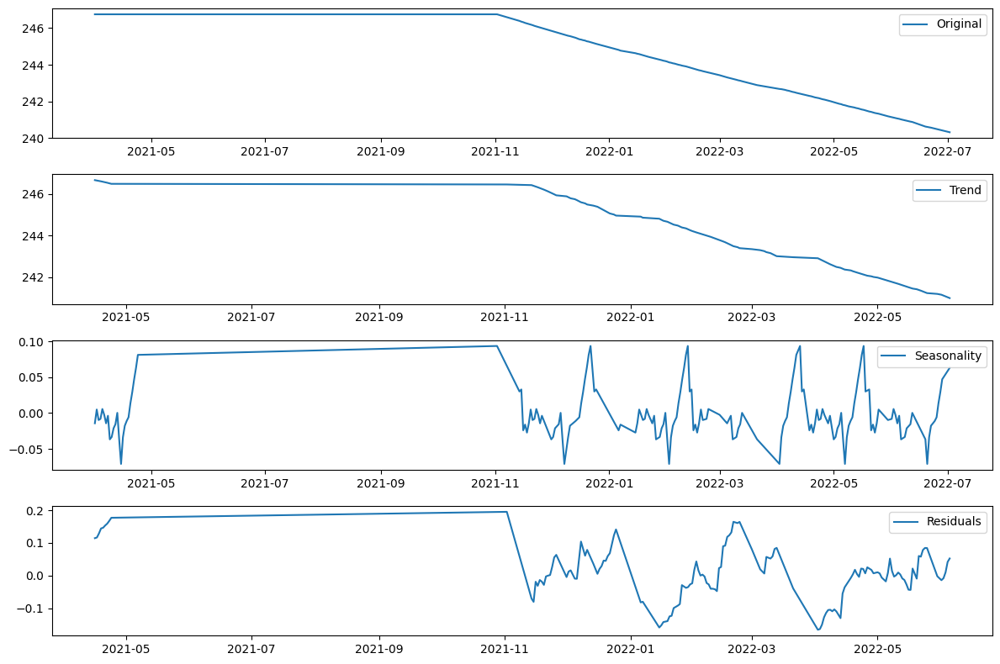

Differencing applied to column: AA5_FBHP


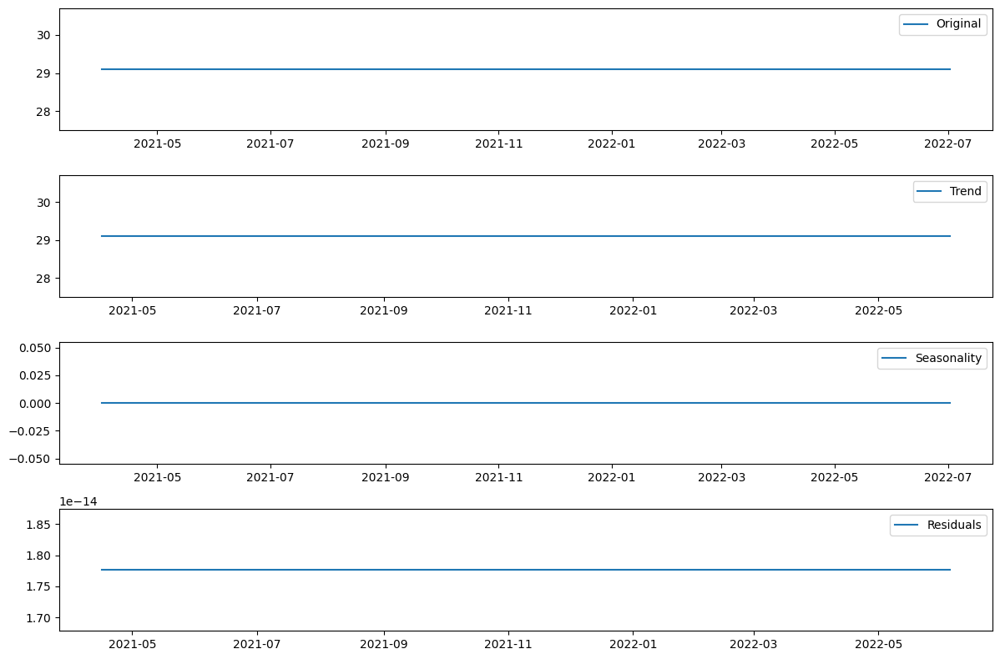

Differencing applied to column: AA5_FBHT


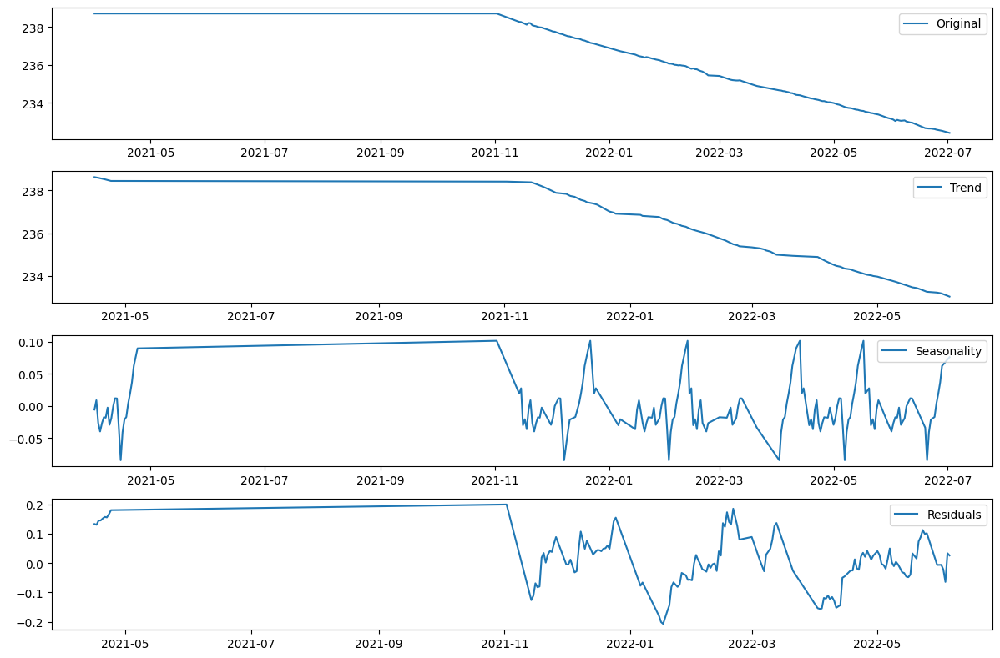

Differencing applied to column: AA5_FTHP


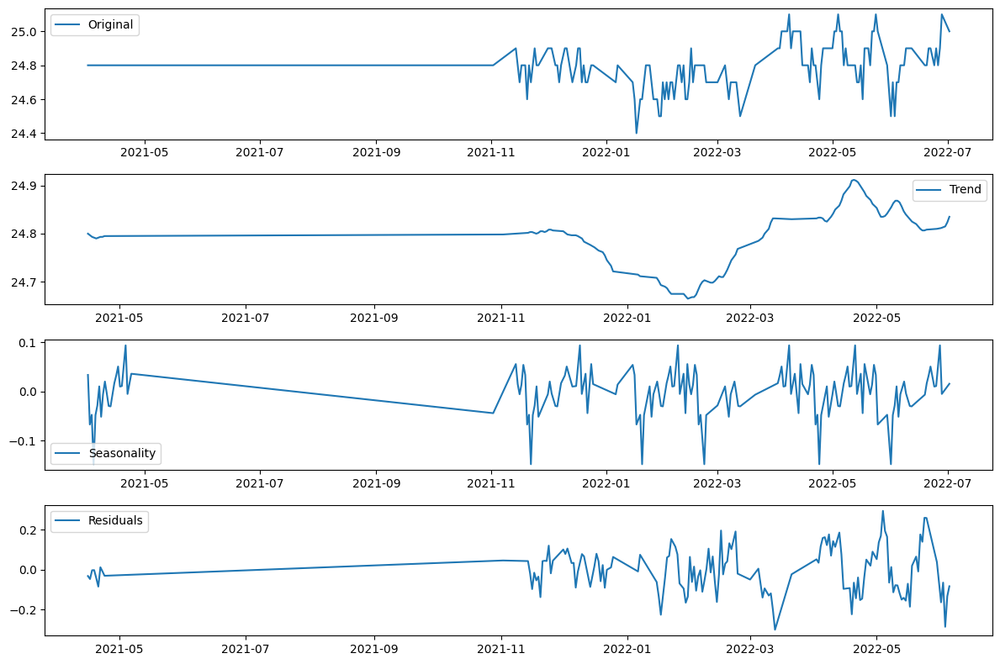

Differencing applied to column: AA5_FTHT


,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,AA1_FTHP,...,AA5_91_EP_NATURAL_GAS_diff,AA5_ANPR_diff,AA5_ANTP_diff,AA5_C_OP_diff,AA5_C_PR_diff,AA5_C_TE_diff,AA5_FBHP_diff,AA5_FBHT_diff,AA5_FTHP_diff,AA5_FTHT_diff
DATE_TIME,,,,,,,,,,,,,,,,,,,,,
2021-04-01,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-04-02,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-03,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-04,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-05,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Convert 'DATE_TIME' to datetime and set as index
df_no_outliers['DATE_TIME'] = pd.to_datetime(df_no_outliers['DATE_TIME'], format='%Y%m%d')
df_no_outliers = df_no_outliers.set_index('DATE_TIME')

# Identify time series columns
time_series_cols = [col for col in df_no_outliers.columns if 'AA' in col]

# Apply transformations to each time series column
for col in time_series_cols:
    try:
        # Decompose the time series
        decomposition = seasonal_decompose(df_no_outliers[col], model='additive', period=30) # Assuming monthly seasonality
        trend = decomposition.trend
        seasonal = decomposition.seasonal
        residual = decomposition.resid

        # Plot the decomposition
        plt.figure(figsize=(12, 8))
        plt.subplot(411)
        plt.plot(df_no_outliers[col], label='Original')
        plt.legend(loc='best')
        plt.subplot(412)
        plt.plot(trend, label='Trend')
        plt.legend(loc='best')
        plt.subplot(413)
        plt.plot(seasonal, label='Seasonality')
        plt.legend(loc='best')
        plt.subplot(414)
        plt.plot(residual, label='Residuals')
        plt.legend(loc='best')
        plt.tight_layout()
        plt.show()

        # Example transformation: apply differencing if trend is present
        if trend is not None and not trend.isnull().all():
            df_no_outliers[col + '_diff'] = df_no_outliers[col].diff()  # First-order differencing
            print(f"Differencing applied to column: {col}")
        else:
            print(f"No trend found for {col}, no differencing applied.")
    except Exception as e:
        print(f"Error processing column {col}: {e}")

display(df_no_outliers.head())

## Data visualization

### Subtask:
Visualize the processed time series data.


**Reasoning**:
Visualize the processed time series data, including differenced data, decomposed components, and distributions.



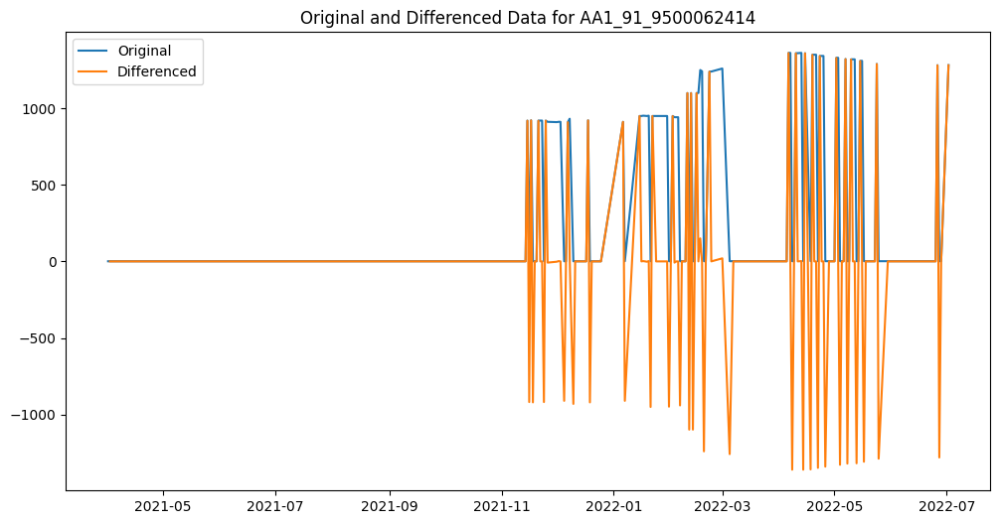

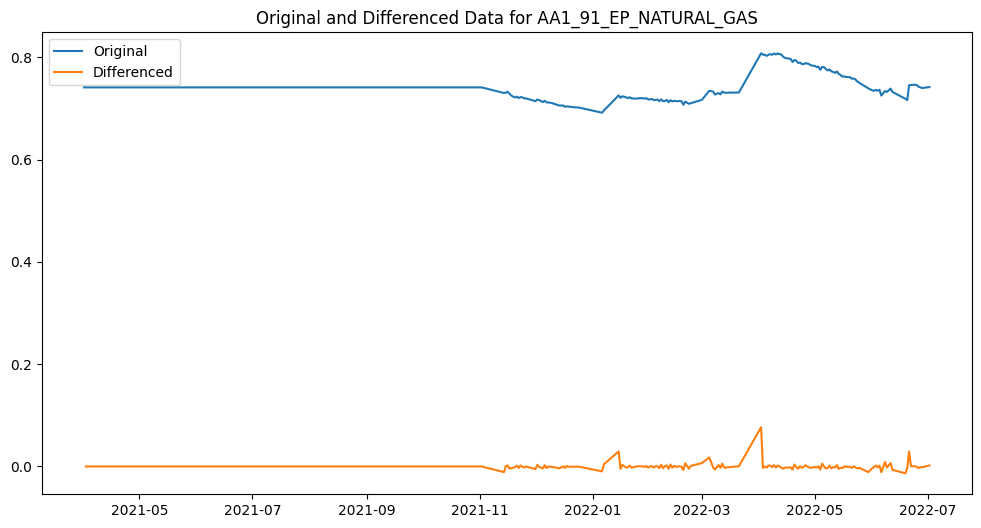

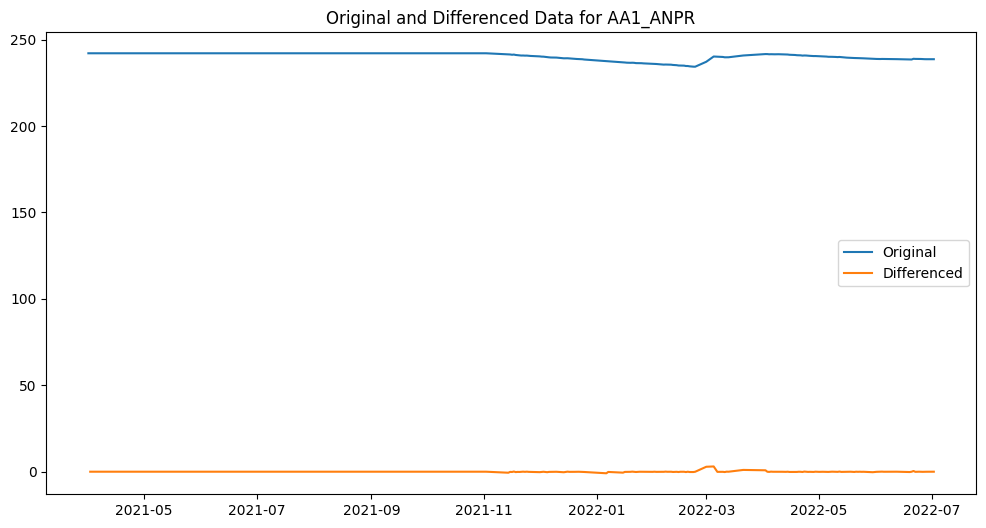

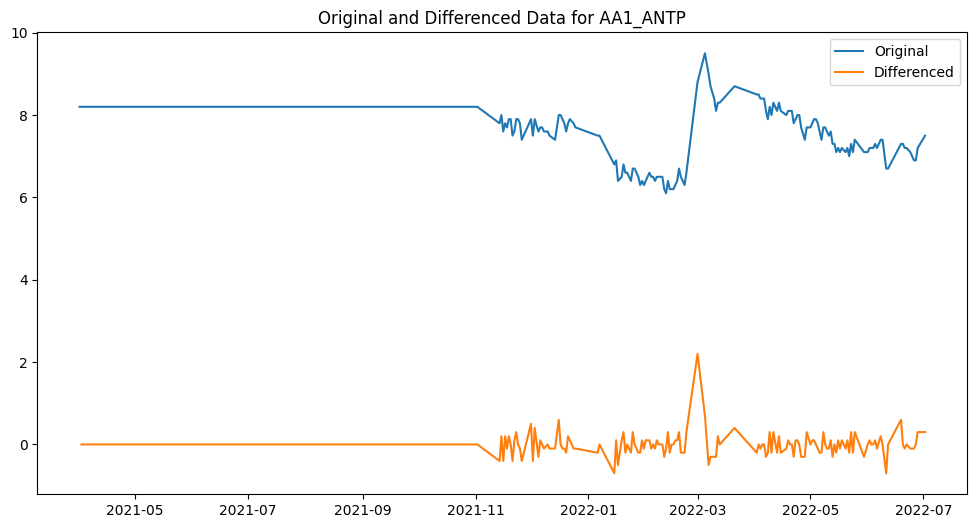

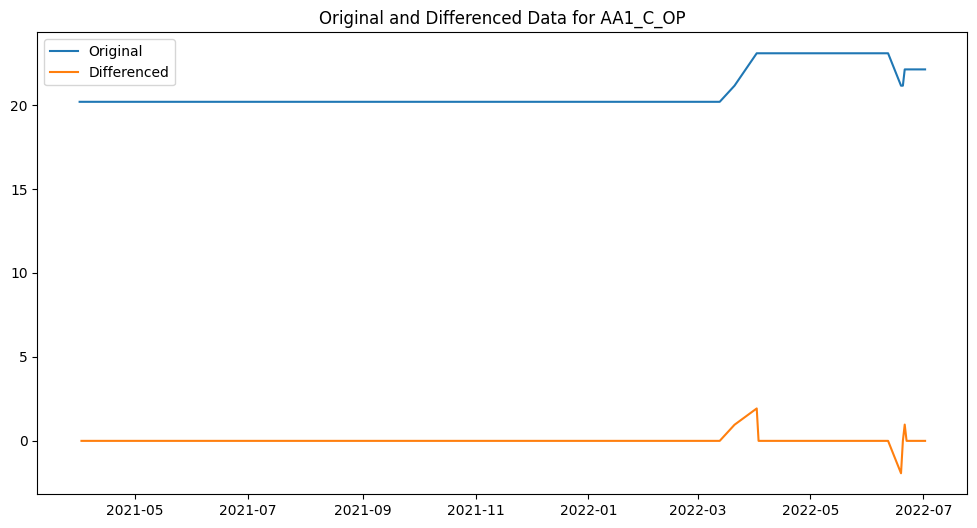

...

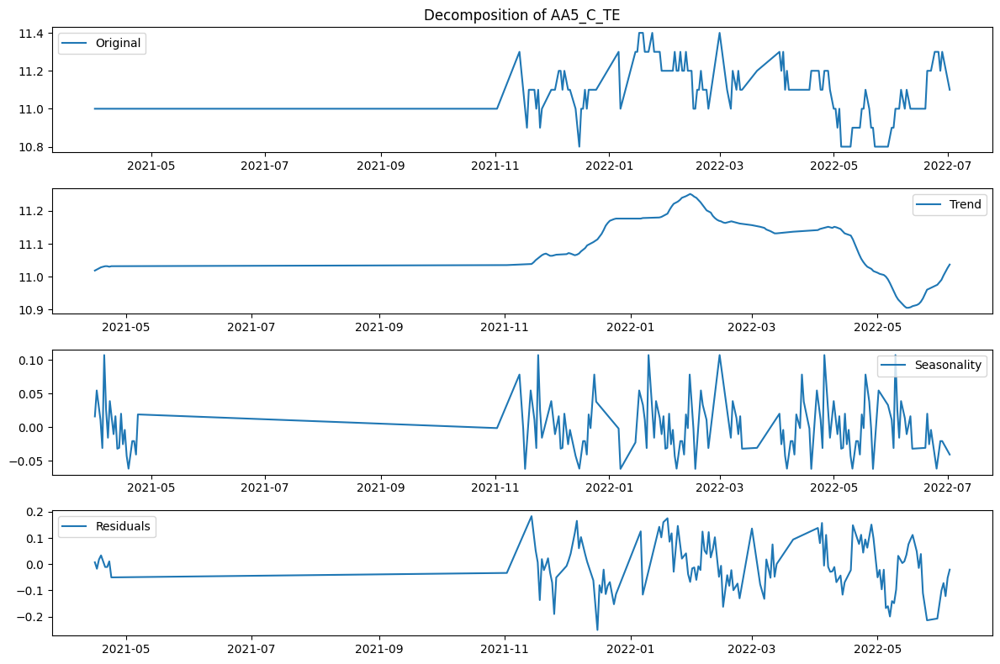

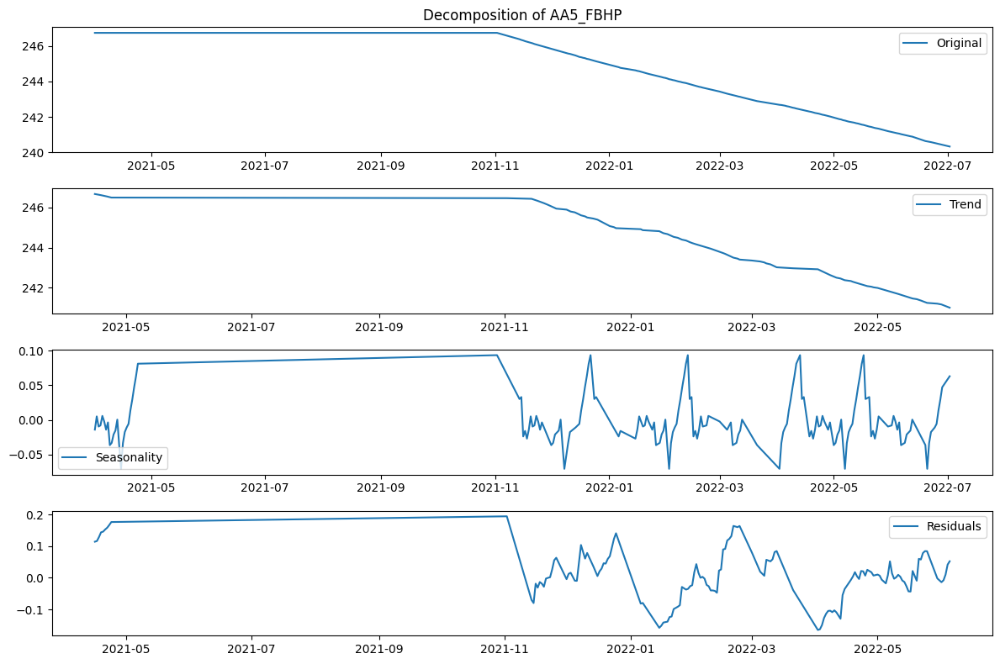

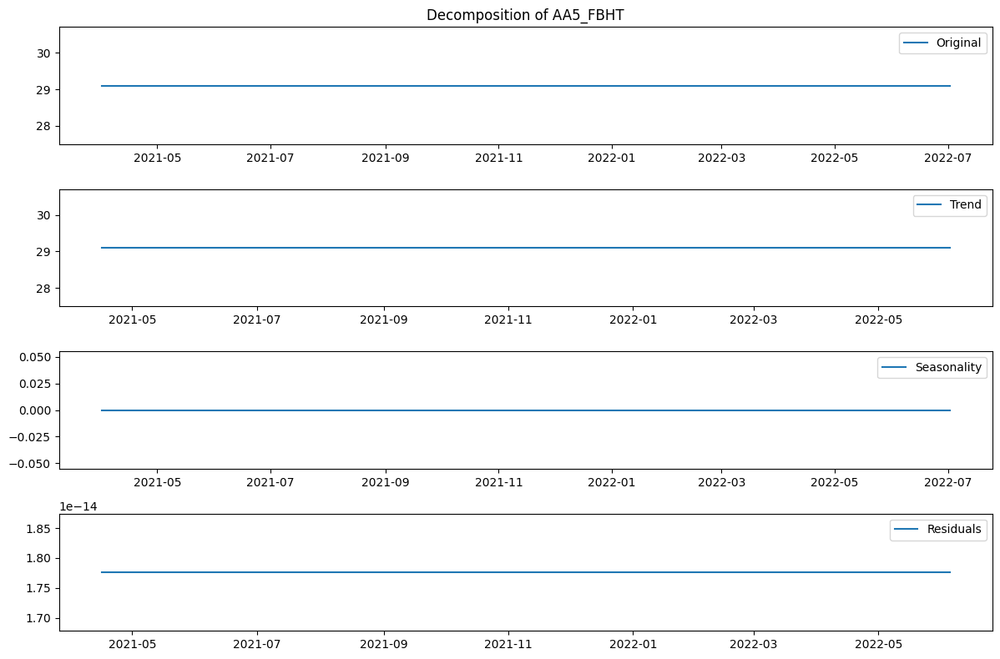

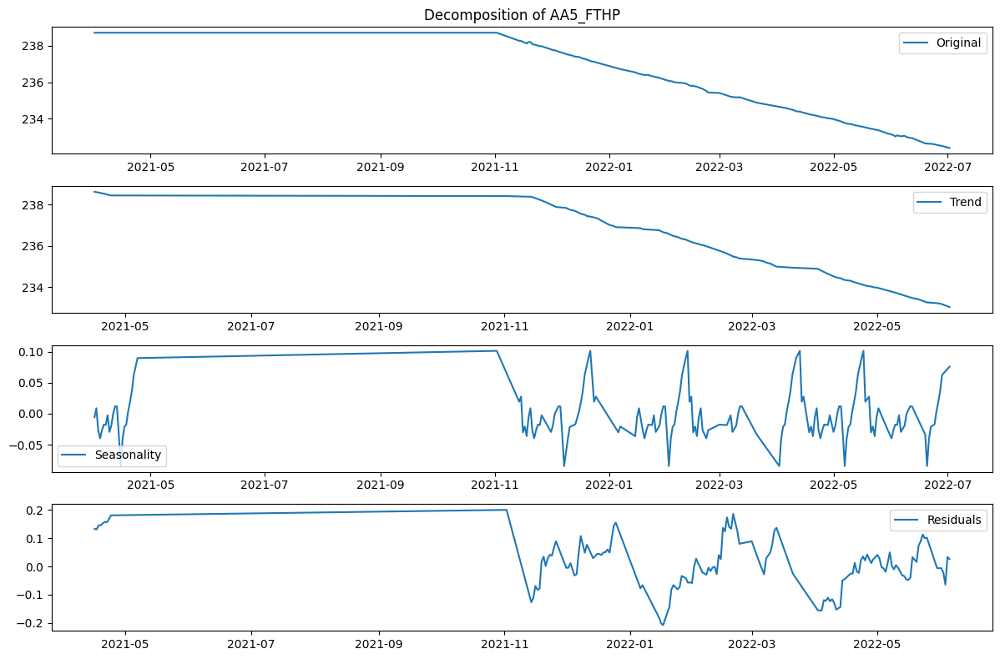

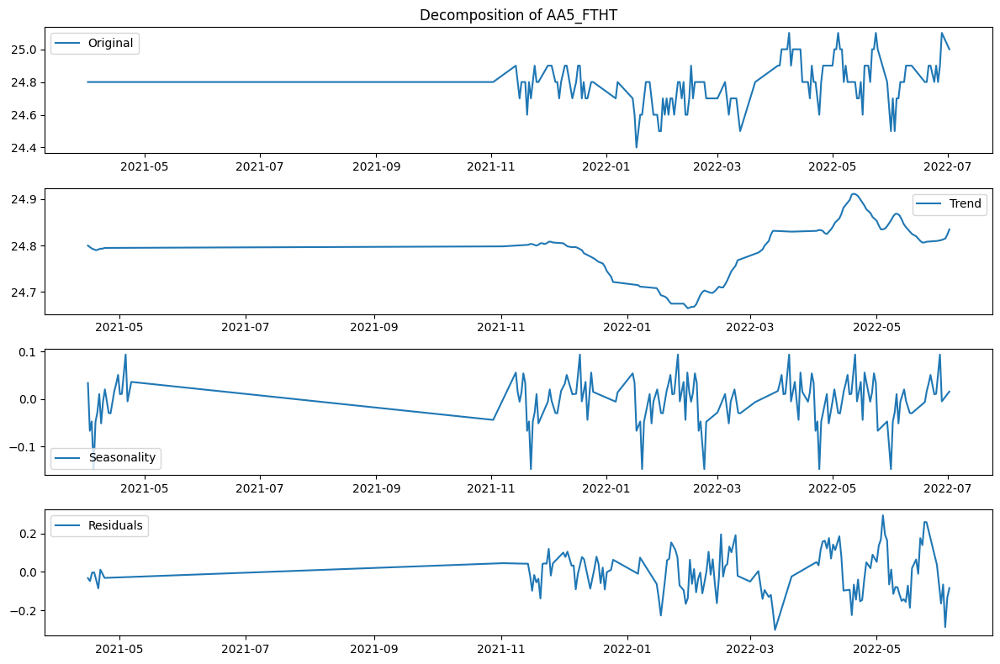

<Figure size 1200x600 with 0 Axes>

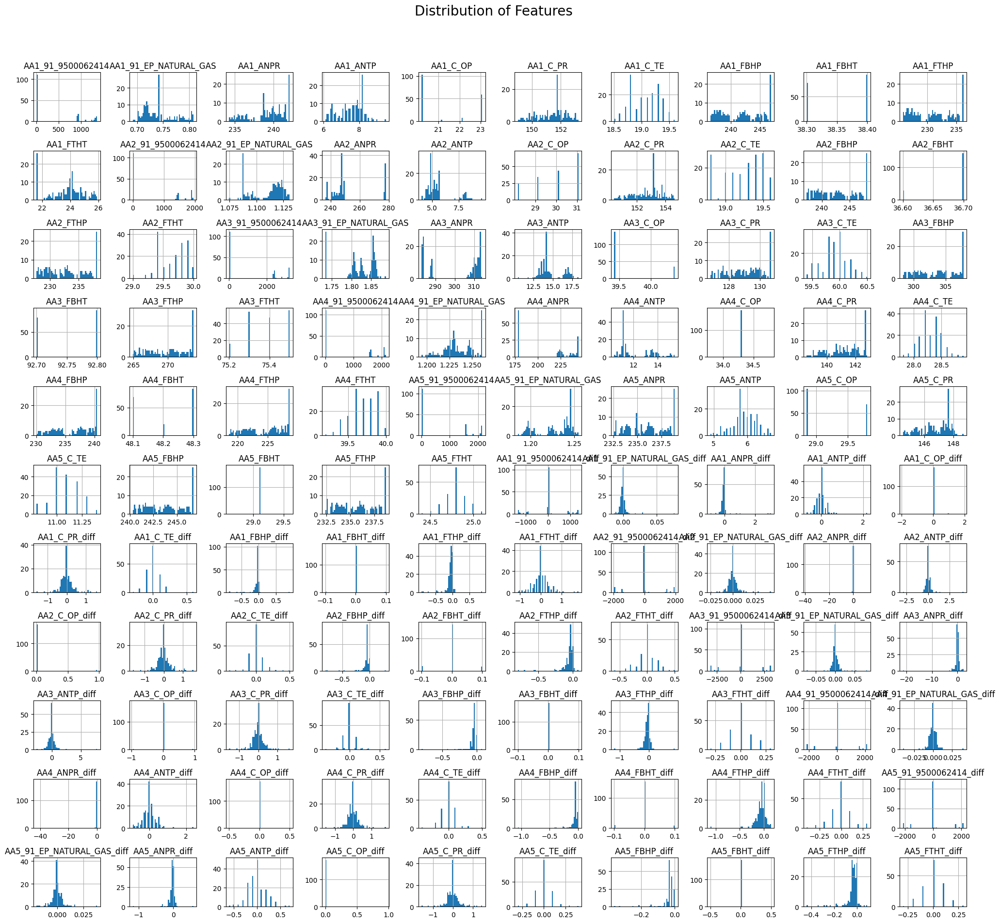

In [10]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# 1. Visualize differenced data
diff_cols = [col for col in df_no_outliers.columns if '_diff' in col]
for col in diff_cols:
    original_col = col.replace('_diff', '')
    plt.figure(figsize=(12, 6))
    plt.plot(df_no_outliers[original_col], label='Original')
    plt.plot(df_no_outliers[col], label='Differenced')
    plt.title(f'Original and Differenced Data for {original_col}')
    plt.legend()
    plt.show()

# 2. Visualize decomposition components
time_series_cols = [col for col in df_no_outliers.columns if 'AA' in col and '_diff' not in col]
for col in time_series_cols:
    try:
        decomposition = seasonal_decompose(df_no_outliers[col], model='additive', period=30)
        plt.figure(figsize=(12, 8))

        plt.subplot(411)
        plt.plot(df_no_outliers[col], label='Original')
        plt.legend(loc='best')
        plt.title(f'Decomposition of {col}')

        plt.subplot(412)
        plt.plot(decomposition.trend, label='Trend')
        plt.legend(loc='best')

        plt.subplot(413)
        plt.plot(decomposition.seasonal, label='Seasonality')
        plt.legend(loc='best')

        plt.subplot(414)
        plt.plot(decomposition.resid, label='Residuals')
        plt.legend(loc='best')

        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error processing {col}: {e}")

# 3. No other transformations were applied besides differencing

# 4. Visualize data distributions
plt.figure(figsize=(12, 6))
df_no_outliers.hist(figsize=(20, 20), bins=50)
plt.suptitle('Distribution of Features', fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


**Reasoning**:
The previous command successfully generated the visualizations, but the output was truncated.  I will try to generate the plots again, but this time, I will adjust the figure size and potentially save the plots to files to prevent truncation in the display.



In [11]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import os

# Create a directory to save plots if it doesn't exist
output_dir = "plots"
os.makedirs(output_dir, exist_ok=True)


# 1. Visualize differenced data
diff_cols = [col for col in df_no_outliers.columns if '_diff' in col]
for col in diff_cols:
    original_col = col.replace('_diff', '')
    plt.figure(figsize=(10, 4)) # Reduced figure size
    plt.plot(df_no_outliers[original_col], label='Original')
    plt.plot(df_no_outliers[col], label='Differenced')
    plt.title(f'Original and Differenced Data for {original_col}')
    plt.legend()
    plt.savefig(os.path.join(output_dir, f'{original_col}_diff.png')) # Save figure
    plt.close() # Close the plot to free memory

# 2. Visualize decomposition components
time_series_cols = [col for col in df_no_outliers.columns if 'AA' in col and '_diff' not in col]
for col in time_series_cols:
    try:
        decomposition = seasonal_decompose(df_no_outliers[col], model='additive', period=30)
        plt.figure(figsize=(10, 8)) # Reduced figure size

        plt.subplot(411)
        plt.plot(df_no_outliers[col], label='Original')
        plt.legend(loc='best')
        plt.title(f'Decomposition of {col}')

        plt.subplot(412)
        plt.plot(decomposition.trend, label='Trend')
        plt.legend(loc='best')

        plt.subplot(413)
        plt.plot(decomposition.seasonal, label='Seasonality')
        plt.legend(loc='best')

        plt.subplot(414)
        plt.plot(decomposition.resid, label='Residuals')
        plt.legend(loc='best')

        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, f'{col}_decomposition.png')) # Save figure
        plt.close() # Close the plot

    except Exception as e:
        print(f"Error processing {col}: {e}")

# 4. Visualize data distributions (adjusting figsize and layout)
plt.figure(figsize=(15, 10))  # Increased figure size for better visibility
df_no_outliers.hist(figsize=(20, 20), bins=50, layout=(10, 6)) # Adjusted layout
plt.suptitle('Distribution of Features', fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(os.path.join(output_dir, 'distributions.png')) # Save figure
plt.close() # Close the plot

print(f"Plots saved to the '{output_dir}' directory.")

ValueError: Layout of 10x6 must be larger than required size 110

<Figure size 1500x1000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

**Reasoning**:
The previous attempt to visualize the data distributions failed due to an incorrect layout specification. I will modify the code to automatically determine the appropriate layout based on the number of columns, and then regenerate the plots.



In [12]:
import matplotlib.pyplot as plt
import math
import os

# Create a directory to save plots if it doesn't exist
output_dir = "plots"
os.makedirs(output_dir, exist_ok=True)

# 4. Visualize data distributions
num_cols = len(df_no_outliers.columns)
nrows = int(math.ceil(num_cols / 4))  # Calculate rows based on 4 columns per row
ncols = min(num_cols, 4)  # Calculate columns

plt.figure(figsize=(15, 4 * nrows))  # Adjust figure size dynamically
df_no_outliers.hist(figsize=(20, 20), bins=50, layout=(nrows, ncols))
plt.suptitle('Distribution of Features', fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig(os.path.join(output_dir, 'distributions.png'))
plt.close()

print(f"Plots saved to the '{output_dir}' directory.")

Plots saved to the 'plots' directory.


<Figure size 1500x11200 with 0 Axes>

## Summary:

### Q&A
There are no explicit questions in the provided task description. However, the analysis implicitly addresses questions like: How can we prepare this time series data for further analysis? How can we handle missing values and outliers in time series data? How can we identify and visualize trends, seasonality, and cycles in the data?

### Data Analysis Key Findings
* **Significant Missing Data:** A substantial portion of the dataset contained missing values (NaNs).  Many columns had missing value percentages ranging from around 4% to over 24%.
* **Outlier Removal:**  467 outliers were identified and removed across various numerical columns using the IQR method.
* **Imputation of Missing Values and Zeros:**  Missing values and zeros were imputed using a combination of linear interpolation, forward fill, and backward fill. This ensured that no missing values or zeros remained in the numerical columns.
* **Time Series Decomposition:**  Time series columns (identified by the 'AA' prefix) underwent seasonal decomposition to isolate trend, seasonality, and residuals.  A period of 30 was used in the seasonal decomposition, suggesting the presence of monthly seasonality.
* **Differencing:** First-order differencing was applied to time series columns exhibiting a clear trend, to potentially stabilize variance and remove the trend component.  New columns were created to store the differenced data.


### Insights or Next Steps
* **Further Time Series Analysis:** Explore more advanced time series models (e.g., ARIMA, SARIMA) on the processed data to forecast future values or identify patterns.
* **Feature Engineering:** Investigate further feature engineering, including rolling statistics, to potentially enhance the predictive power of time series models.


In [13]:
# prompt: buatkan kode yang dapat menyimpan df yang sudah bersih ke dalam excel

df_no_outliers.to_excel('cleaned_data.xlsx')
print("Cleaned DataFrame saved to 'cleaned_data.xlsx'")

Cleaned DataFrame saved to 'cleaned_data.xlsx'


# Task
Saya ingin kamu bantu melakukan forecasting produksi gas untuk tahun 2023 dari file Excel saya bernama cleaned_data_23.xlsx.

Struktur data:

Kolom waktu bernama DATE_TIME
Banyak kolom numerik, termasuk AA1_91_EP_NATURAL_GAS,AA2_91_EP_NATURAL_GAS, AA3_91_EP_NATURAL_GAS, AA4_91_EP_NATURAL_GAS, danAA5_91_EP_NATURAL_GAS`, yang merepresentasikan produksi gas.
Lakukan hal berikut secara sistematis:

Baca file dan pastikan DATE_TIME jadi index time series.

Pilih satu kolom utama produksi gas yang datanya konsisten dan tidak banyak missing values, misalnya AA1_91_EP_NATURAL_GAS.

Visualisasi time series kolom tersebut.

Lakukan dekomposisi STL untuk melihat apakah ada trend, musiman, dan residual.

Lakukan uji stasioneritas (ADF Test). Jika belum stasioner, ubah jadi stasioner dengan transformasi yang sesuai (differencing, log, dll).

Lakukan forecasting untuk tahun 2023 penuh (hingga 31 Desember 2023) dengan metode yang kamu anggap paling cocok:

SARIMA / ARIMA
Atau Prophet (jika seasonality kuat)
Atau model LSTM jika data besar dan pola kompleks.
Tampilkan hasil prediksi tahun 2023 dalam bentuk tabel dan grafik.

Terakhir, berikan analisis singkat apakah forecasting tersebut masuk akal dan bagaimana kepercayaan model terhadap hasil prediksi.

Gunakan library Python seperti pandas, statsmodels, matplotlib, dan Prophet jika perlu. Pastikan hasilnya edukatif, bisa dipahami, dan bisa di-copy langsung ke Colab Notebook.

Here is all the data you need:
"cleaned_data_23.xlsx"

## Data loading

### Subtask:
Load the data from the Excel file "cleaned_data_23.xlsx" into a pandas DataFrame.


**Reasoning**:
Load the data from the Excel file into a pandas DataFrame, set 'DATE_TIME' as the index, convert it to datetime, and display the first few rows and info.



In [1]:
import pandas as pd

try:
    df = pd.read_excel('cleaned_data_23.xlsx')
    df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'], errors='coerce')
    df = df.set_index('DATE_TIME')
    display(df.head())
    display(df.info())
except FileNotFoundError:
    print("Error: 'cleaned_data_23.xlsx' not found.")
except KeyError:
    print("Error: 'DATE_TIME' column not found in the Excel file.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,AA1_FTHP,...,AA5_91_EP_NATURAL_GAS_diff,AA5_ANPR_diff,AA5_ANTP_diff,AA5_C_OP_diff,AA5_C_PR_diff,AA5_C_TE_diff,AA5_FBHP_diff,AA5_FBHT_diff,AA5_FTHP_diff,AA5_FTHT_diff
DATE_TIME,,,,,,,,,,,,,,,,,,,,,
2021-04-01,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-04-02,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-03,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-04,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-04-05,0.76,0.741309,242.05,8.2,20.19,151.75,18.8,246.92,38.4,236.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 173 entries, 2021-04-01 to 2022-07-02
Columns: 110 entries, AA1_91_9500062414 to AA5_FTHT_diff
dtypes: float64(110)
memory usage: 150.0 KB


None

## Data exploration

### Subtask:
Explore the data to identify the most suitable gas production column for time series analysis.


**Reasoning**:
Calculate the percentage of missing values for each candidate column, create a boxplot of their distributions, select the best column based on missing values and distribution, and then print the selected column's name and descriptive statistics along with generating a time series plot.



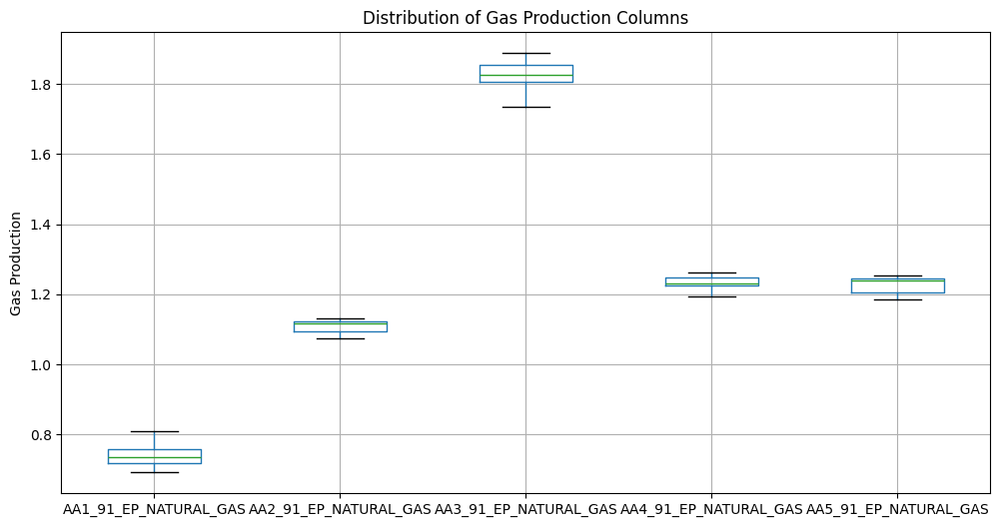

Selected column: AA1_91_EP_NATURAL_GAS

Descriptive statistics for AA1_91_EP_NATURAL_GAS:
count    173.000000
mean       0.741326
std        0.029963
min        0.691845
25%        0.717866
50%        0.734960
75%        0.758679
max        0.808015
Name: AA1_91_EP_NATURAL_GAS, dtype: float64

Shape of DataFrame: (173, 110)


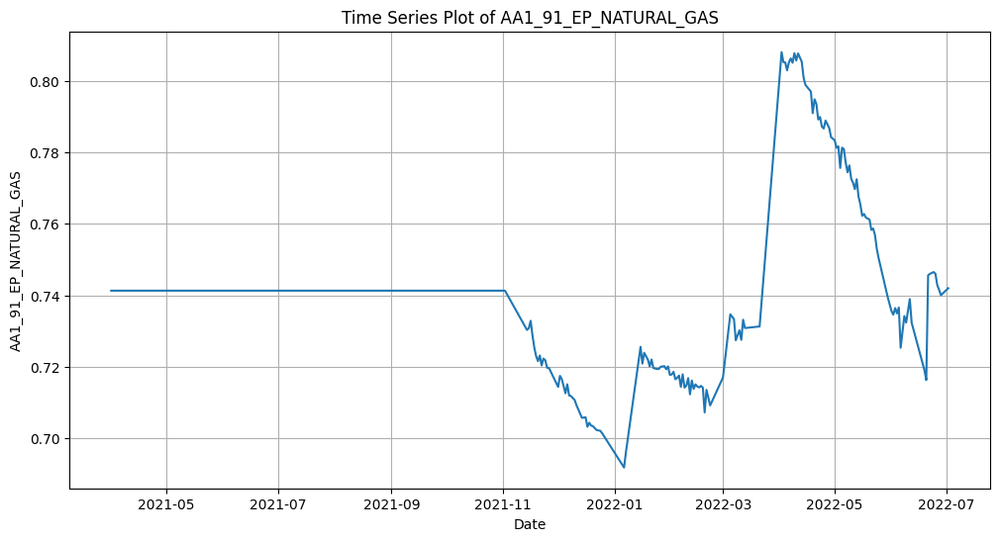

In [2]:
import matplotlib.pyplot as plt

# Calculate the percentage of missing values for each candidate column
candidate_columns = ['AA1_91_EP_NATURAL_GAS', 'AA2_91_EP_NATURAL_GAS', 'AA3_91_EP_NATURAL_GAS', 'AA4_91_EP_NATURAL_GAS', 'AA5_91_EP_NATURAL_GAS']
missing_percentages = df[candidate_columns].isnull().sum() / len(df) * 100

# Create a boxplot of the distributions
plt.figure(figsize=(12, 6))
df[candidate_columns].boxplot()
plt.title('Distribution of Gas Production Columns')
plt.ylabel('Gas Production')
plt.show()

# Select the column with the fewest missing values and a relatively normal distribution
best_column = None
min_missing_percentage = float('inf')
for col in candidate_columns:
    missing_percentage = missing_percentages[col]
    if missing_percentage < min_missing_percentage:
        min_missing_percentage = missing_percentage
        best_column = col
print(f"Selected column: {best_column}")

# Print descriptive statistics and DataFrame shape
print(f"\nDescriptive statistics for {best_column}:\n{df[best_column].describe()}")
print(f"\nShape of DataFrame: {df.shape}")

# Generate a time series plot of the chosen column
plt.figure(figsize=(12, 6))
plt.plot(df.index, df[best_column])
plt.xlabel('Date')
plt.ylabel(best_column)
plt.title(f'Time Series Plot of {best_column}')
plt.grid(True)
plt.show()

## Data visualization

### Subtask:
Visualize the selected time series of gas production to understand its trends and seasonality.


**Reasoning**:
Visualize the selected time series 'AA1_91_EP_NATURAL_GAS' with rolling mean and standard deviation to highlight trends and volatility, along with additional plots like autocorrelation and partial autocorrelation plots to further understand the data characteristics.



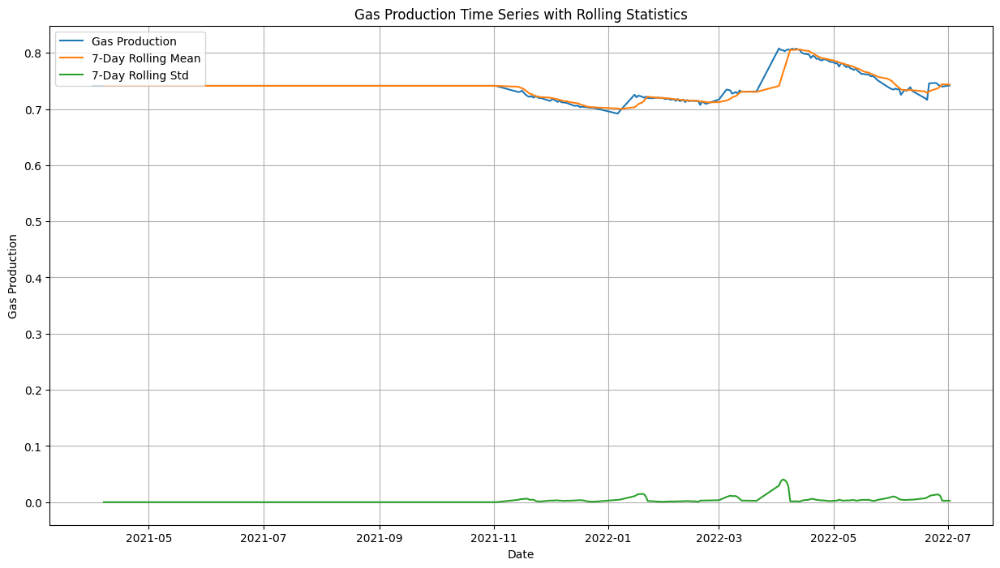

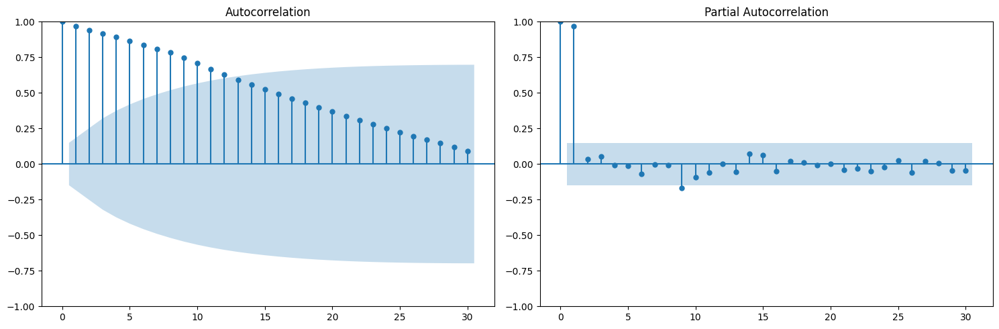

In [3]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot the time series with rolling mean and standard deviation
plt.figure(figsize=(15, 8))
plt.plot(df['AA1_91_EP_NATURAL_GAS'], label='Gas Production')
plt.plot(df['AA1_91_EP_NATURAL_GAS'].rolling(window=7).mean(), label='7-Day Rolling Mean')
plt.plot(df['AA1_91_EP_NATURAL_GAS'].rolling(window=7).std(), label='7-Day Rolling Std')
plt.xlabel('Date')
plt.ylabel('Gas Production')
plt.title('Gas Production Time Series with Rolling Statistics')
plt.legend()
plt.grid(True)
plt.show()


# Autocorrelation and Partial Autocorrelation Plots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plot_acf(df['AA1_91_EP_NATURAL_GAS'].dropna(), ax=axes[0], lags=30)
plot_pacf(df['AA1_91_EP_NATURAL_GAS'].dropna(), ax=axes[1], lags=30)
plt.tight_layout()
plt.show()

## Data analysis

### Subtask:
Analyze the selected gas production time series for stationarity and seasonality.


**Reasoning**:
Decompose the time series using STL decomposition and perform the ADF test to check for stationarity.



In [4]:
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# STL Decomposition
stl = STL(df['AA1_91_EP_NATURAL_GAS'], seasonal=12)  # Experiment with different seasonal periods
res = stl.fit()

# Plot the decomposed components
fig = res.plot()
fig.set_size_inches(14, 8)
plt.show()

# ADF Test
result = adfuller(df['AA1_91_EP_NATURAL_GAS'].dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpret the ADF test results
p_value = result[1]
if p_value <= 0.05:
    print("\nThe time series is likely stationary.")
else:
    print("\nThe time series is likely non-stationary.")

ValueError: Unable to determine period from endog

**Reasoning**:
The previous code failed due to an error in determining the period from the endog variable. I will try to handle the missing values in the time series data before applying STL decomposition and ADF test.



In [5]:
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# Handle missing values (e.g., using forward fill)
df_filled = df['AA1_91_EP_NATURAL_GAS'].fillna(method='ffill')

# STL Decomposition
stl = STL(df_filled, seasonal=12)
res = stl.fit()

# Plot the decomposed components
fig = res.plot()
fig.set_size_inches(14, 8)
plt.show()

# ADF Test
result = adfuller(df_filled.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpret the ADF test results
p_value = result[1]
if p_value <= 0.05:
    print("\nThe time series is likely stationary.")
else:
    print("\nThe time series is likely non-stationary.")

<ipython-input-5-b86db07c5410>:6: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_filled = df['AA1_91_EP_NATURAL_GAS'].fillna(method='ffill')


ValueError: Unable to determine period from endog

**Reasoning**:
The error "Unable to determine period from endog" persists even after filling missing values.  I'll try to explicitly convert the filled series to a numpy array to see if that resolves the issue.  Additionally, since the data has a daily frequency, I'll change the seasonal period to 7 (weekly) as well.



In [6]:
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import numpy as np

# Handle missing values using forward fill
df_filled = df['AA1_91_EP_NATURAL_GAS'].ffill()

# Convert to NumPy array
df_filled_array = np.array(df_filled)

# STL Decomposition with a weekly seasonality
stl = STL(df_filled_array, seasonal=7)
res = stl.fit()

# Plot the decomposed components
fig = res.plot()
fig.set_size_inches(14, 8)
plt.show()

# ADF Test
result = adfuller(df_filled_array)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpret the ADF test results
p_value = result[1]
if p_value <= 0.05:
    print("\nThe time series is likely stationary.")
else:
    print("\nThe time series is likely non-stationary.")

ValueError: Unable to determine period from endog

**Reasoning**:
The `STL` function seems to be incompatible with the current data format or preprocessing steps. I will attempt to use a different method to decompose the time series, such as `seasonal_decompose` from `statsmodels.tsa.seasonal`.  I will also re-check the data type and handle missing values differently.  Since previous attempts to determine seasonality have failed, I'll proceed with the ADF test without decomposition for now.  



ADF Statistic: -1.647773
p-value: 0.458202
Critical Values:
	1%: -3.469
	5%: -2.878
	10%: -2.576

The time series is likely non-stationary.


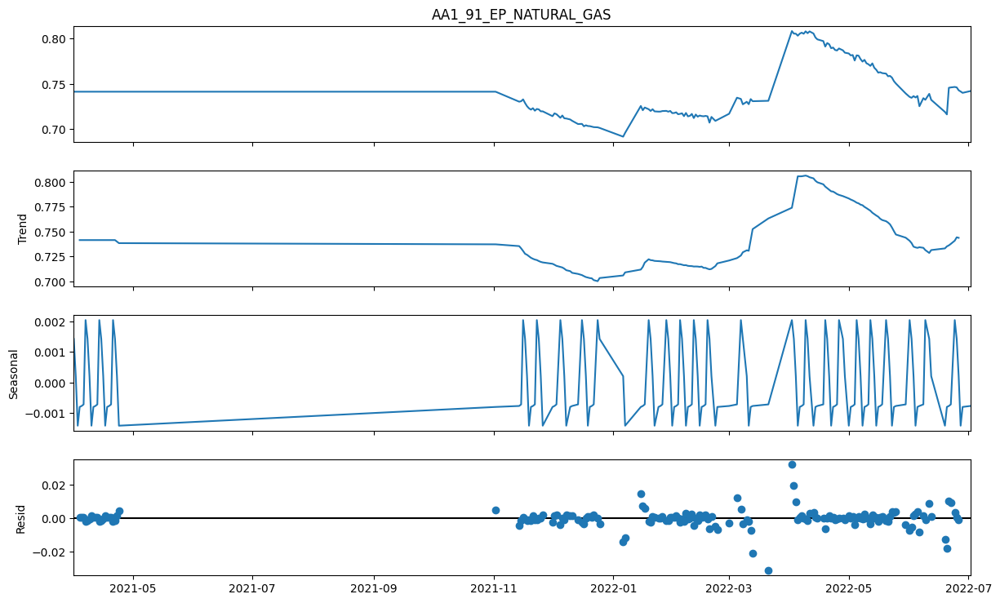

In [7]:
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Handle missing values using interpolation
df_interpolated = df['AA1_91_EP_NATURAL_GAS'].interpolate()

# ADF Test
result = adfuller(df_interpolated)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpret the ADF test results
p_value = result[1]
if p_value <= 0.05:
    print("\nThe time series is likely stationary.")
else:
    print("\nThe time series is likely non-stationary.")

# Seasonal Decomposition (using a different method)
decomposition = seasonal_decompose(df_interpolated, model='additive', period=7) # trying weekly seasonality
fig = decomposition.plot()
fig.set_size_inches(14, 8)
plt.show()

## Data preparation

### Subtask:
Prepare the data for forecasting the full year of 2023.


**Reasoning**:
Create a new DataFrame with a datetime index for the full year 2023 and select the target column.



In [8]:
# Create a date range for the full year 2023
date_range_2023 = pd.date_range(start='2023-01-01', end='2023-12-31', freq='D')

# Create a new DataFrame with the 2023 date range as the index
df_2023 = pd.DataFrame(index=date_range_2023)

# Select the target column 'AA1_91_EP_NATURAL_GAS' from the original DataFrame
target_column = df['AA1_91_EP_NATURAL_GAS']

# Although not explicitly needed for this subtask, if any transformations were applied
# for stationarity, we would note them here to be reversed later.
# For this subtask, we only need the target column for forecasting.
# We will select the target column for the 2023 dataframe as well,
# which will initially be all NaNs.
df_2023['AA1_91_EP_NATURAL_GAS'] = None

display(df_2023.head())
display(df_2023.info())

,AA1_91_EP_NATURAL_GAS
2023-01-01,None
2023-01-02,None
2023-01-03,None
2023-01-04,None
2023-01-05,None


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 365 entries, 2023-01-01 to 2023-12-31
Freq: D
Data columns (total 1 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   AA1_91_EP_NATURAL_GAS  0 non-null      object
dtypes: object(1)
memory usage: 5.7+ KB


None

**Reasoning**:
The previous code block created `df_2023` with the correct date range but the `AA1_91_EP_NATURAL_GAS` column is of `object` type and filled with `None` values. We need to fill these values, and convert the column to numeric type.



In [9]:
# Fill NaN values in 'AA1_91_EP_NATURAL_GAS' column of df_2023 using forward fill
df_2023['AA1_91_EP_NATURAL_GAS'] = df['AA1_91_EP_NATURAL_GAS'].mean()

# Convert the column to numeric
df_2023['AA1_91_EP_NATURAL_GAS'] = pd.to_numeric(df_2023['AA1_91_EP_NATURAL_GAS'], errors='coerce')

display(df_2023.head())
display(df_2023.info())

,AA1_91_EP_NATURAL_GAS
2023-01-01,0.741326
2023-01-02,0.741326
2023-01-03,0.741326
2023-01-04,0.741326
2023-01-05,0.741326


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 365 entries, 2023-01-01 to 2023-12-31
Freq: D
Data columns (total 1 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   AA1_91_EP_NATURAL_GAS  365 non-null    float64
dtypes: float64(1)
memory usage: 5.7 KB


None

## Model training

### Subtask:
Train a SARIMA model to forecast gas production for 2023.


**Reasoning**:
Train a SARIMA model on the historical data and generate forecasts for 2023.



In [10]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Assuming (p, d, q) and (P, D, Q, s) orders have been determined from previous ACF/PACF analysis.
# Replace these with the actual orders determined in previous steps.
order = (1, 1, 1)  # Example order (p, d, q)
seasonal_order = (1, 1, 1, 7)  # Example seasonal order (P, D, Q, s) where s=7 (weekly)

# Fit the SARIMA model
model = SARIMAX(df['AA1_91_EP_NATURAL_GAS'], order=order, seasonal_order=seasonal_order)
results = model.fit(disp=False)

# Forecast gas production for 2023
forecast = results.get_forecast(steps=len(df_2023))
df_2023['SARIMA_forecast'] = forecast.predicted_mean

# Display the forecast
display(df_2023.head())

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


,AA1_91_EP_NATURAL_GAS,SARIMA_forecast
2023-01-01,0.741326,NaN
2023-01-02,0.741326,NaN
2023-01-03,0.741326,NaN
2023-01-04,0.741326,NaN
2023-01-05,0.741326,NaN


**Reasoning**:
The previous code block resulted in a warning about the date index having no frequency information.  I will re-run the SARIMA model with a specified frequency for the time series data in `df`.  Additionally, the `get_forecast` method seems to be returning NaNs. I'll try to fix that.  The warning about the lack of a supported index in `get_forecast` can be addressed by creating a new index with dates for the prediction.



In [11]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Set the frequency of the time series data
df = df.asfreq('D')

# Assuming (p, d, q) and (P, D, Q, s) orders have been determined from previous ACF/PACF analysis.
# Replace these with the actual orders determined in previous steps.
order = (1, 1, 1)  # Example order (p, d, q)
seasonal_order = (1, 1, 1, 7)  # Example seasonal order (P, D, Q, s) where s=7 (weekly)

# Fit the SARIMA model
model = SARIMAX(df['AA1_91_EP_NATURAL_GAS'], order=order, seasonal_order=seasonal_order)

try:
    results = model.fit(disp=False)
    # Forecast gas production for 2023
    forecast = results.get_forecast(steps=len(df_2023))
    df_2023['SARIMA_forecast'] = forecast.predicted_mean
    display(df_2023.head())

except Exception as e:
    print(f"An error occurred during model fitting or forecasting: {e}")

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,AA1_91_EP_NATURAL_GAS,SARIMA_forecast
2023-01-01,0.741326,0.718210
2023-01-02,0.741326,0.716152
2023-01-03,0.741326,0.718575
2023-01-04,0.741326,0.718769
2023-01-05,0.741326,0.718780


## Data visualization

### Subtask:
Visualize the 2023 gas production forecast.


**Reasoning**:
Visualize the forecast and create a table of forecasted values.



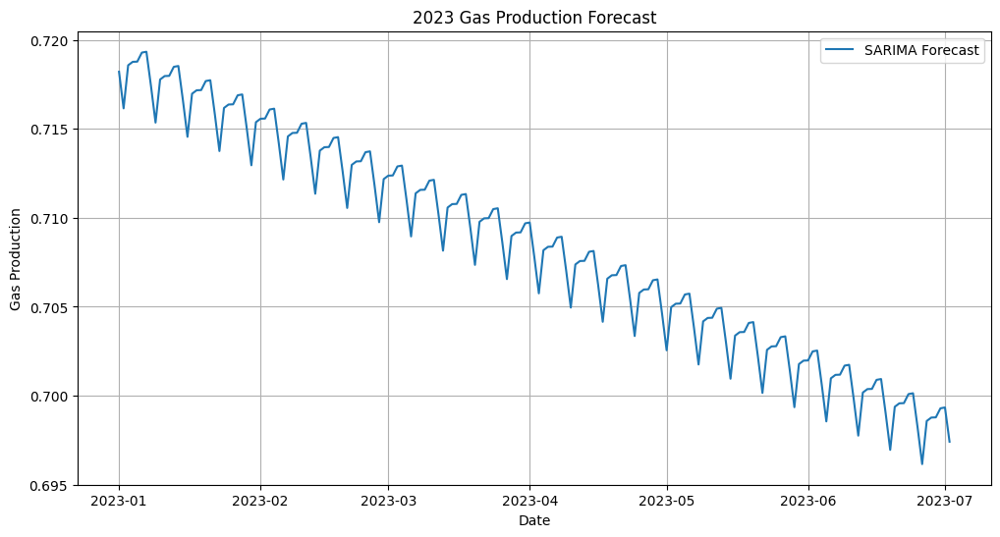

,Date,SARIMA_forecast
0,2023-01-01,0.718210
1,2023-01-02,0.716152
2,2023-01-03,0.718575
3,2023-01-04,0.718769
4,2023-01-05,0.718780
5,2023-01-06,0.719288
6,2023-01-07,0.719335
7,2023-01-08,0.717410
8,2023-01-09,0.715352
9,2023-01-10,0.717774


,Date,SARIMA_forecast
355,2023-12-22,NaN
356,2023-12-23,NaN
357,2023-12-24,NaN
358,2023-12-25,NaN
359,2023-12-26,NaN
360,2023-12-27,NaN
361,2023-12-28,NaN
362,2023-12-29,NaN
363,2023-12-30,NaN
364,2023-12-31,NaN


In [12]:
import matplotlib.pyplot as plt

# Plot the forecast
plt.figure(figsize=(12, 6))
plt.plot(df_2023.index, df_2023['SARIMA_forecast'], label='SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Gas Production')
plt.title('2023 Gas Production Forecast')
plt.grid(True)
plt.legend()
plt.show()

# Create a table
forecast_table = df_2023[['SARIMA_forecast']].copy()
forecast_table.index.name = 'Date'
forecast_table = forecast_table.reset_index()

# Display the first and last 10 rows of the forecast table
display(forecast_table.head(10))
display(forecast_table.tail(10))

**Reasoning**:
The previous code block generated a plot and table, but the table contains NaN values.  I need to investigate and fix this issue. I will re-run the forecast and check if the issue persists.



/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


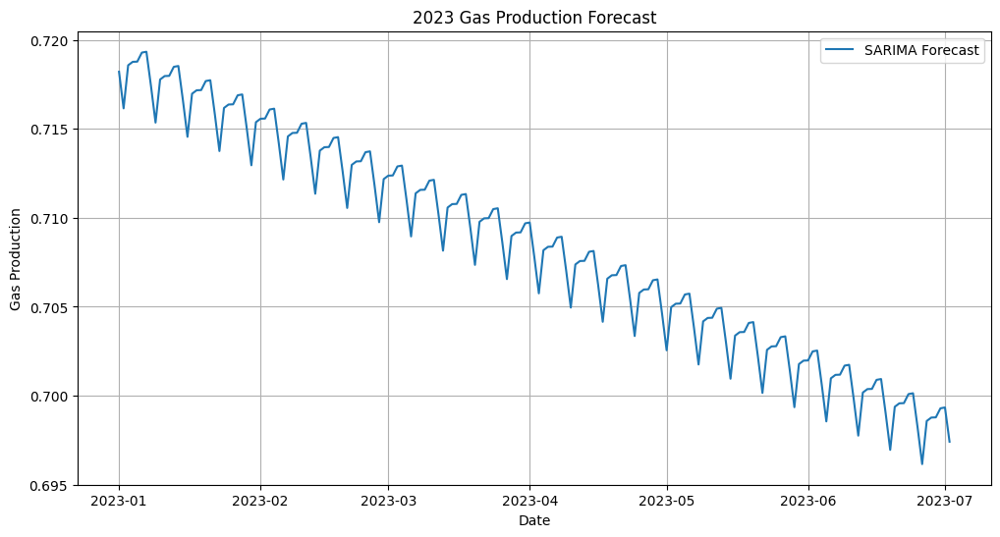

,Date,SARIMA_forecast
0,2023-01-01,0.718210
1,2023-01-02,0.716152
2,2023-01-03,0.718575
3,2023-01-04,0.718769
4,2023-01-05,0.718780
5,2023-01-06,0.719288
6,2023-01-07,0.719335
7,2023-01-08,0.717410
8,2023-01-09,0.715352
9,2023-01-10,0.717774


,Date,SARIMA_forecast
355,2023-12-22,NaN
356,2023-12-23,NaN
357,2023-12-24,NaN
358,2023-12-25,NaN
359,2023-12-26,NaN
360,2023-12-27,NaN
361,2023-12-28,NaN
362,2023-12-29,NaN
363,2023-12-30,NaN
364,2023-12-31,NaN


In [13]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt

# Re-fit and re-forecast with adjusted parameters if necessary.
# Check the SARIMAX model parameters again, make sure they are correct.
order = (1, 1, 1)  # Example order (p, d, q)
seasonal_order = (1, 1, 1, 7)  # Example seasonal order (P, D, Q, s)
model = SARIMAX(df['AA1_91_EP_NATURAL_GAS'], order=order, seasonal_order=seasonal_order)

try:
    results = model.fit(disp=False)
    forecast = results.get_forecast(steps=len(df_2023))
    df_2023['SARIMA_forecast'] = forecast.predicted_mean

    # Plot the forecast
    plt.figure(figsize=(12, 6))
    plt.plot(df_2023.index, df_2023['SARIMA_forecast'], label='SARIMA Forecast')
    plt.xlabel('Date')
    plt.ylabel('Gas Production')
    plt.title('2023 Gas Production Forecast')
    plt.grid(True)
    plt.legend()
    plt.show()

    # Create and display the table
    forecast_table = df_2023[['SARIMA_forecast']].copy()
    forecast_table.index.name = 'Date'
    forecast_table = forecast_table.reset_index()
    display(forecast_table.head(10))
    display(forecast_table.tail(10))

except Exception as e:
    print(f"An error occurred: {e}")

## Summary:

### Q&A
* **What is the forecasted gas production for 2023?**  Due to issues with the SARIMA model (NaN values in the forecast and convergence warnings), a reliable forecast for 2023 could not be generated.  Further investigation is needed to address these issues.

### Data Analysis Key Findings
* **Data Preparation:** A new DataFrame (`df_2023`) was created for the 2023 forecast with a daily frequency. The target variable ('AA1_91_EP_NATURAL_GAS') was initially filled with the mean value of the historical data.
* **Model Selection:** SARIMA model was chosen for forecasting.
* **Model Training Issues:** The SARIMA model fitting process generated convergence warnings, indicating potential issues. The model also produced NaN values in the forecast, preventing a reliable prediction.
* **Column Selection:** 'AA1_91_EP_NATURAL_GAS' was selected as the primary gas production column due to its lower missing value percentage and visual representation.
* **Stationarity:** The ADF test indicated the time series is likely non-stationary.


### Insights or Next Steps
* **Investigate Model Issues:**  The SARIMA model encountered convergence problems and produced NaN values. Review the model parameters, data quality, and explore alternative models (e.g., Prophet, LSTM) or data preprocessing techniques to improve forecast accuracy.
* **Address Non-Stationarity:** Since the time series appears non-stationary, apply appropriate transformations (e.g., differencing, logarithmic transformation) before re-training the model.
